In [1]:
#NOTE about this version - 
#(1) All implementations are vectorized and have been checked against original implementation.
#(2) eps is added to all spectrograms to get rid of divide by zero error.
#(3) Dividing by freq_bin is removed in the SH implementation - not specified in original paper.
#(4) No NaN problems so the pandas notnull function has been removed everywhere
#(5) Calling acoustic indices functions from a separate .ipynb file - AcousticInd - note: importing numpy, defining eps in each
#(6) Loads data from .npy files
#(7) Normalizing data using sklearn.preprocessing: 
#(7.a) MinMaxScaler for [0,1] and [-1,1] ranges and (7.b) StandardScaler for 0 mean and unit variance
#Added the 'norm' parameter to get_df_and_plot to normalize if norm=1.

#Has operations to get different scatterplots as functions named exp1_... and so on.

#This program loads data from 4 different classes
#good, bad, human, maybe

#And uses 5 different acoustic indices on num_spec recordings from each
#1. ACI 2. ADI 3. ADI_even 4. SH 5. NDSI

#Each recording is exactly 2 s long

#Final result: a scatter plot for each acoustic index + scatterplot matrix - pandas

#Spectrograms used: original+4 differential channels


In [2]:
#imports
import numpy as np
from matplotlib import pyplot as plt
import os

#for scatter matrix
import pandas as pd
from pandas.plotting import scatter_matrix

#setting eps value for converting spec to log
eps = 1e-10

#function definitions for acoustic indices begin here


In [3]:
#imports for Acoustic indices functions
from ipynb.fs.full.AcousticInd import compute_aci
from ipynb.fs.full.AcousticInd import compute_adi
from ipynb.fs.full.AcousticInd import get_start_stop_indices
from ipynb.fs.full.AcousticInd import compute_adi_even
from ipynb.fs.full.AcousticInd import compute_sh
from ipynb.fs.full.AcousticInd import compute_ndsi

In [4]:
#function to load spectrograms and display dimensions (optional)
def load_display_dimensions(class_name, str_file, dim=0):

    #   description of data files
    #   spec_data is like a dict with fields
    #   'specs' (contains the mel-filtered spectrograms, in linear scale, as [num_specs, num_rows, num_cols])
    #   'spec_f' (contains the frequency axis points as a 1D array)
    #   'spec_t' (contains the time axis points as a 1D array)   
    
    fname_load = class_name + str_file
    spec_data = np.load(fname_load)
    
    time_steps = len(spec_data['spec_t'])
    freq_bins = len(spec_data['spec_f'])
    
    if (dim==1):
        print('File has %i specs of dimensions (%i x %i)' % (
        spec_data['specs'].shape[0], spec_data['specs'].shape[1], spec_data['specs'].shape[2]))
        print('Frequency axis points are in spec_data[\'spec_f\'] and has %i values' % freq_bins)
        print('Time axis points are in spec_data[\'spec_t\'] and has %i values' % time_steps)
        
    return spec_data, time_steps, freq_bins
    


In [5]:
#function to calculate all acoustic indices and plot spectrogram (optional)
def calc_plot(num_bins, spec_start_idx, num_specs, spec_data, ch, time_steps, freq_bins, freq_vals, start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot=0):
    
    ACI = np.zeros((num_specs, 1))
    ADI = np.zeros((num_specs, 1))
    ADI_even = np.zeros((num_specs, 1))
    SH = np.zeros((num_specs, 1))
    NDSI = np.zeros((num_specs, 1))
       
    if (plot==1):
        fig, axes = plt.subplots(num_specs, 1, sharex='all')
        plt.title('Spectrogram for ' + 'good')
      
    #Store log version of all spectrograms in all_specs
    #all_specs = 10 * np.log10(spec_data['specs'][spec_start_idx:spec_start_idx+num_specs, :, :] + eps)
    
    if(ch==-1):
        #Original spectrogram
        all_specs = 10 * np.log10(spec_data['specs'][spec_start_idx:spec_start_idx+num_specs, :, :] + eps)
    elif (ch==5):
        #Experiment no. 4 - has 3 dimensions only
        all_specs = spec_data
    else:
        #4 differential channels so 1 dimension extra at the end for which channel
        all_specs = spec_data['specs'][spec_start_idx:spec_start_idx+num_specs, :, :, ch] 

    #Vectorized implementations 
    ACI = compute_aci(all_specs, time_steps, freq_bins, num_specs)
    ADI = compute_adi(all_specs, time_steps)
    ADI_even = compute_adi_even(num_bins, all_specs, freq_vals, start_freq_idx, stop_freq_idx)
    SH = compute_sh(all_specs, time_steps, freq_bins)
    NDSI = compute_ndsi(all_specs, start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq)
             
    if(plot==1):
        cax = axes[spec_idx].imshow(current_spec, cmap=plt.get_cmap('jet'), interpolation='none', origin='lower')
        fig.colorbar(cax, ax=axes[spec_idx], orientation='vertical')
        
    
    return ACI, ADI, ADI_even, SH, NDSI


In [6]:
#calls all functions for each class - is for the original data
def calls_orig(class_name, spec_start_idx, num_specs, multiples, num_bins, dim, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot=0):

    #Load the correct file
    str_file = '.npz'
    spec_data, time_steps, freq_bins = load_display_dimensions(class_name, str_file, dim)
    
    #Calling helper function for compute_adi_even
    start_freq_idx, stop_freq_idx = get_start_stop_indices(spec_data['spec_f'], multiples, num_bins)

    #Computing acoustic indices for all 4 channels
    ch = -1
    ACI, ADI, ADI_even, SH, NDSI = calc_plot(num_bins, spec_start_idx, num_specs, spec_data, ch, time_steps, freq_bins, spec_data['spec_f'], start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot)
    
    return ACI, ADI, ADI_even, SH, NDSI

In [7]:
#calls all functions for each class
def calls(class_name, spec_start_idx, num_specs, multiples, num_bins, dim, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot=0):

    #Load the correct file
    str_file = '_preprocessed_uncompressed.npz'
    spec_data, time_steps, freq_bins = load_display_dimensions(class_name, str_file, dim)
    
    #Calling helper function for compute_adi_even
    start_freq_idx, stop_freq_idx = get_start_stop_indices(spec_data['spec_f'], multiples, num_bins)

    #Computing acoustic indices for all 4 channels
    ACI1, ADI1, ADI_even1, SH1, NDSI1 = calc_plot(num_bins, spec_start_idx, num_specs, spec_data, 0, time_steps, freq_bins, spec_data['spec_f'], start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot)
    ACI2, ADI2, ADI_even2, SH2, NDSI2 = calc_plot(num_bins, spec_start_idx, num_specs, spec_data, 1, time_steps, freq_bins, spec_data['spec_f'], start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot)
    ACI3, ADI3, ADI_even3, SH3, NDSI3 = calc_plot(num_bins, spec_start_idx, num_specs, spec_data, 2, time_steps, freq_bins, spec_data['spec_f'], start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot)
    ACI4, ADI4, ADI_even4, SH4, NDSI4 = calc_plot(num_bins, spec_start_idx, num_specs, spec_data, 3, time_steps, freq_bins, spec_data['spec_f'], start_freq_idx, stop_freq_idx, start_a_freq, stop_a_freq, start_b_freq, stop_b_freq, plot)

    return ACI1, ADI1, ADI_even1, SH1, NDSI1, ACI2, ADI2, ADI_even2, SH2, NDSI2, ACI3, ADI3, ADI_even3, SH3, NDSI3, ACI4, ADI4, ADI_even4, SH4, NDSI4
       

In [8]:
#Main - setting all parameters

#Defining classes
class1 = 'good'
class2 = 'bad'
class3 = 'human'
class4 = 'maybe'

#Make sure the indices don't get larger than spec_data['specs'].shape[0]
spec_start_idx = 0
#num_specs = 2

num_specs_g = 2958
num_specs_b = 127
num_specs_h = 205
num_specs_m = 131
'''
num_specs_g = 120
num_specs_b = 120
num_specs_h = 120
num_specs_m = 120'''

#Other parameters
plot = 0
dim = 1
num_bins = 8            #for compute_adi_even
multiples = 1000

#NDSI bin frequencies in kHz - a = anthrophony, b = biophony
#Values set according to the original paper
start_a_freq = 1
stop_a_freq = 2
start_b_freq = 2
stop_b_freq = 8



In [9]:
#Loading .npz files for ACI

ACI = np.load('ACI.npz', mmap_mode='r')
ACI_good = ACI['Good']
ACI_bad = ACI['Bad']
ACI_human = ACI['Human']
ACI_maybe = ACI['Maybe']

ACI_G  = ACI_good[0]
ACI_G1 = ACI_good[1]
ACI_G2 = ACI_good[2]
ACI_G3 = ACI_good[3]
ACI_G4 = ACI_good[4]

ACI_B  = ACI_bad[0]
ACI_B1 = ACI_bad[1]
ACI_B2 = ACI_bad[2]
ACI_B3 = ACI_bad[3]
ACI_B4 = ACI_bad[4]

ACI_H  = ACI_human[0]
ACI_H1 = ACI_human[1]
ACI_H2 = ACI_human[2]
ACI_H3 = ACI_human[3]
ACI_H4 = ACI_human[4]

ACI_M  = ACI_maybe[0]
ACI_M1 = ACI_maybe[1]
ACI_M2 = ACI_maybe[2]
ACI_M3 = ACI_maybe[3]
ACI_M4 = ACI_maybe[4]


In [10]:
#Loading .npz files for ADI

ADI = np.load('ADI.npz', mmap_mode='r')
ADI_good = ADI['Good']
ADI_bad = ADI['Bad']
ADI_human = ADI['Human']
ADI_maybe = ADI['Maybe']

ADI_G  = ADI_good[0]
ADI_G1 = ADI_good[1]
ADI_G2 = ADI_good[2]
ADI_G3 = ADI_good[3]
ADI_G4 = ADI_good[4]

ADI_B  = ADI_bad[0]
ADI_B1 = ADI_bad[1]
ADI_B2 = ADI_bad[2]
ADI_B3 = ADI_bad[3]
ADI_B4 = ADI_bad[4]

ADI_H  = ADI_human[0]
ADI_H1 = ADI_human[1]
ADI_H2 = ADI_human[2]
ADI_H3 = ADI_human[3]
ADI_H4 = ADI_human[4]

ADI_M  = ADI_maybe[0]
ADI_M1 = ADI_maybe[1]
ADI_M2 = ADI_maybe[2]
ADI_M3 = ADI_maybe[3]
ADI_M4 = ADI_maybe[4]
   

In [11]:
#Loading .npz files for ADI_even
  
ADI_even = np.load('ADI_even.npz', mmap_mode='r')
ADI_even_good = ADI_even['Good']
ADI_even_bad = ADI_even['Bad']
ADI_even_human = ADI_even['Human']
ADI_even_maybe = ADI_even['Maybe']

ADI_even_G  = ADI_even_good[0]
ADI_even_G1 = ADI_even_good[1]
ADI_even_G2 = ADI_even_good[2]
ADI_even_G3 = ADI_even_good[3]
ADI_even_G4 = ADI_even_good[4]

ADI_even_B  = ADI_even_bad[0]
ADI_even_B1 = ADI_even_bad[1]
ADI_even_B2 = ADI_even_bad[2]
ADI_even_B3 = ADI_even_bad[3]
ADI_even_B4 = ADI_even_bad[4]

ADI_even_H  = ADI_even_human[0]
ADI_even_H1 = ADI_even_human[1]
ADI_even_H2 = ADI_even_human[2]
ADI_even_H3 = ADI_even_human[3]
ADI_even_H4 = ADI_even_human[4]

ADI_even_M  = ADI_even_maybe[0]
ADI_even_M1 = ADI_even_maybe[1]
ADI_even_M2 = ADI_even_maybe[2]
ADI_even_M3 = ADI_even_maybe[3]
ADI_even_M4 = ADI_even_maybe[4]


In [12]:
#Loading .npz files for SH
  
SH = np.load('SH.npz', mmap_mode='r')
SH_good = SH['Good']
SH_bad = SH['Bad']
SH_human = SH['Human']
SH_maybe = SH['Maybe']

SH_G  = SH_good[0]
SH_G1 = SH_good[1]
SH_G2 = SH_good[2]
SH_G3 = SH_good[3]
SH_G4 = SH_good[4]

SH_B  = SH_bad[0]
SH_B1 = SH_bad[1]
SH_B2 = SH_bad[2]
SH_B3 = SH_bad[3]
SH_B4 = SH_bad[4]

SH_H  = SH_human[0]
SH_H1 = SH_human[1]
SH_H2 = SH_human[2]
SH_H3 = SH_human[3]
SH_H4 = SH_human[4]

SH_M  = SH_maybe[0]
SH_M1 = SH_maybe[1]
SH_M2 = SH_maybe[2]
SH_M3 = SH_maybe[3]
SH_M4 = SH_maybe[4]

In [13]:
#Loading .npz files for NDSI

NDSI = np.load('NDSI.npz', mmap_mode='r')
NDSI_good = NDSI['Good']
NDSI_bad = NDSI['Bad']
NDSI_human = NDSI['Human']
NDSI_maybe = NDSI['Maybe']

NDSI_G  = NDSI_good[0]
NDSI_G1 = NDSI_good[1]
NDSI_G2 = NDSI_good[2]
NDSI_G3 = NDSI_good[3]
NDSI_G4 = NDSI_good[4]

NDSI_B  = NDSI_bad[0]
NDSI_B1 = NDSI_bad[1]
NDSI_B2 = NDSI_bad[2]
NDSI_B3 = NDSI_bad[3]
NDSI_B4 = NDSI_bad[4]

NDSI_H  = NDSI_human[0]
NDSI_H1 = NDSI_human[1]
NDSI_H2 = NDSI_human[2]
NDSI_H3 = NDSI_human[3]
NDSI_H4 = NDSI_human[4]

NDSI_M  = NDSI_maybe[0]
NDSI_M1 = NDSI_maybe[1]
NDSI_M2 = NDSI_maybe[2]
NDSI_M3 = NDSI_maybe[3]
NDSI_M4 = NDSI_maybe[4]


In [14]:
#Checking values - original spec
print(ACI_G)
print(ADI_G)
print(ADI_even_G)
print(SH_G)
print(NDSI_G)

[-2.14049673 -2.54817033 -3.03566384 ..., -2.51527715 -2.72154808
 -2.50519514]
[-4.23973322 -4.2365365  -4.2356596  ..., -4.24569273 -4.24492502
 -4.24564171]
[-1.92511901 -1.92958094 -1.91252406 ..., -1.89602883 -1.87694706
 -1.89534093]
[ 247.38447571  247.23579407  247.11869812 ...,  247.75453186  247.64941406
  247.75831604]
[ 0.50118643  0.50784236  0.47877997 ...,  0.4549717   0.43075338
  0.45369023]


In [15]:
#Checking values - channel 1
print(ACI_G1)
print(ADI_G1)
print(ADI_even_G1)
print(SH_G1)
print(NDSI_G1)

[ 80.24328613  46.40418243  83.29124451 ...,  89.10664368  72.58081055
  73.76291656]
[-3.68804741 -2.97216654 -3.47702074 ..., -3.59429765 -3.50733423
 -3.5570569 ]
[-1.88120756 -1.83611191 -1.66684121 ..., -1.72170913 -1.69828243
 -1.74881743]
[  88.35926056   93.82535553   92.69874573 ...,  118.65322876  100.20157623
  168.39102173]
[ 0.7166304   0.712668    0.38475826 ...,  0.61251926  0.75153875
  0.65466219]


In [16]:
#Seaborn for visualizations
import seaborn as sns
sns.set(style="ticks")



In [17]:
#function to scale all columns
def scale_cols(df_scaled, col_name, scaler):
    
    df_scaled[col_name[0]] = scaler.fit_transform(df_scaled[[col_name[0]]])
    df_scaled[col_name[1]] = scaler.fit_transform(df_scaled[[col_name[1]]])
    df_scaled[col_name[2]] = scaler.fit_transform(df_scaled[[col_name[2]]])
    df_scaled[col_name[3]] = scaler.fit_transform(df_scaled[[col_name[3]]])
    df_scaled[col_name[4]] = scaler.fit_transform(df_scaled[[col_name[4]]])
    
    return df_scaled

In [18]:
#Scaling function for 4 types of scaling

#1. StandardScaler for 0 mean and unit variance
#2. MinMaxScaler for [-1,1]
#3. RobustScaler for [-1,1]
#4. MaxAbs scaler for [0,1] - not using sklearn here

def scale_data(df, ch):
    
    #Imports to normalize data

    from sklearn.preprocessing import MinMaxScaler
    from sklearn.preprocessing import StandardScaler
    from sklearn.preprocessing import RobustScaler
    from sklearn.preprocessing import MaxAbsScaler
    
    #To display dataframe within function
    from IPython.display import display
    
    print("Displaying dataframe before scaling:")
    display(df.head())

    scaler1 = StandardScaler()
    scaler2 = MinMaxScaler()                  #(0,1) if all positive, otherwise (-1, 1)
    scaler3 = RobustScaler()

    df_std = df
    df_minmax = df
    df_robust = df
    df_maxabs = df
    
    if(ch==-1):
        col_name = ['ACI', 'ADI', 'ADI_even', 'SH', 'NDSI', 'Class']
    else:
        col_name = ['ACI'+str(ch), 'ADI'+str(ch), 'ADI_even'+str(ch), 'SH'+str(ch), 'NDSI'+str(ch), 'Class'+str(ch)]
               
    #StandardScaler: removes mean and scales to unit variance
    #"Each value in the dataset will have the sample mean value subtracted
    #and then divided by the standard deviation of the whole dataset"
    #At the end, every col has mean=0, std_dev=1
    df_std = scale_cols(df_std, col_name, scaler1)
    print("Displaying dataframe with standard scaling:")
    display(df_std.head())
    print("Max value of each index:")
    print(df_std.max())
    print("Min value of each index:")
    print(df_std.min())

    #MinMaxScaler: (-1, 1) or (0, 1) if data is positive
    df_minmax = scale_cols(df_minmax, col_name, scaler2)
    print("Displaying dataframe with minmax scaling:")
    display(df_minmax.head())
    print("Max value of each index:")
    print(df_minmax.max())
    print("Min value of each index:")
    print(df_minmax.min())
    
    #RobustScaler: Removes the median and scales data between [1st_quartile, 3rd_quartile]
    df_robust = scale_cols(df_robust, col_name, scaler3)
    print("Displaying dataframe with robust scaling:")
    display(df_robust.head())
    print("Max value of each index:")
    print(df_robust.max())
    print("Min value of each index:")
    print(df_robust.min())
    
    #MaxAbsScaler: (0, 1) (depending on which is max) by adding abs(most negative value) to make all values >=0
    
    #Dropping 'Class' column so we can get min of all columns easily and add them
    df_maxabs = df.drop([col_name[5]], axis=1)

    #We only want this done for negative values
    min_cols = df_maxabs.min()
    min_cols[min_cols > 0] = 0
       
    #Adding abs(minimum value)
    df_maxabs = df_maxabs.add(abs(min_cols))

    #Dividing by new col max
    max_cols_new = df_maxabs.max()
    df_maxabs = df_maxabs.div(max_cols_new)
      
    #Re-appending Class column
    df_maxabs = df_maxabs.join(df[col_name[5]])
    
    print("Displaying dataframe with maxabs scaling:")
    display(df_maxabs.head())
    print("Max value of each index:")
    print(df_maxabs.max())
    print("Min value of each index:")
    print(df_maxabs.min())
    
    return df_std, df_minmax, df_robust, df_maxabs                                       
                                                     

In [19]:
#General procedure to get pandas dataframes: 
#(1)reshape the array
#(2) create a dataframe with columns as acoustic indices
#(3) add an extra column with class name

def convert_df(ind1, ind2, ind3, ind4, ind5, num_specs, class_type, ch):
    ind1 = np.reshape(ind1, (num_specs, ))
    ind2 = np.reshape(ind2, (num_specs, ))
    ind3 = np.reshape(ind3, (num_specs, ))
    ind4 = np.reshape(ind4, (num_specs, ))
    ind5 = np.reshape(ind5, (num_specs, ))
    
    Class = class_type

    data = pd.DataFrame({'ACI': ind1, 'ADI': ind2, 'ADI_even': ind3, 'SH': ind4,'NDSI': ind5, 'Class': Class}, columns=['ACI', 'ADI', 'ADI_even', 'SH', 'NDSI', 'Class'])
    #print(data.shape)
    data.head()
    
    #renaming the columns of the dataframe 'data' to be used while combining not NaN rows later
    if(ch!=-1 and ch!=5):
        data.rename(columns={'ACI': 'ACI'+str(ch), 'ADI': 'ADI'+str(ch), 'ADI_even': 'ADI_even'+str(ch), 'SH': 'SH'+str(ch), 'NDSI': 'NDSI'+str(ch), 'Class': 'Class'+str(ch)}, inplace=True)
 
    return data

In [20]:
def get_df_and_plot(norm, ch, ACI_G, ADI_G, ADI_even_G, SH_G, NDSI_G, num_specs_g, ACI_B, ADI_B, ADI_even_B, SH_B, NDSI_B, num_specs_b, ACI_H, ADI_H, ADI_even_H, SH_H, NDSI_H, num_specs_h, ACI_M, ADI_M, ADI_even_M, SH_M, NDSI_M, num_specs_m):


    #Converting to dataframes 
    data_G_orig = convert_df(ACI_G, ADI_G, ADI_even_G, SH_G, NDSI_G, num_specs_g, 'Good', ch)
    data_B_orig = convert_df(ACI_B, ADI_B, ADI_even_B, SH_B, NDSI_B, num_specs_b, 'Bad', ch)
    data_H_orig = convert_df(ACI_H, ADI_H, ADI_even_H, SH_H, NDSI_H, num_specs_h, 'Human', ch)
    data_M_orig = convert_df(ACI_M, ADI_M, ADI_even_M, SH_M, NDSI_M, num_specs_m, 'Maybe', ch)      

    #Scatterplot matrix for all 4 classes
    all_data_arr = [data_G_orig, data_B_orig, data_H_orig, data_M_orig]
    all_data_df = pd.concat(all_data_arr)
 
    if(ch!=-1 and ch!=5):
        Hue = 'Class' + str(ch)
    else:
        Hue = 'Class'
       
    if(norm==1):
        
        df_std, df_minmax, df_robust, df_maxabs = scale_data(all_data_df, ch)
        
        gb_df_std = df_std[~df_std[Hue].isin(['Human', 'Maybe'])]
        gb_df_minmax = df_minmax[~df_minmax[Hue].isin(['Human', 'Maybe'])]
        gb_df_robust = df_robust[~df_robust[Hue].isin(['Human', 'Maybe'])]
        gb_df_maxabs = df_maxabs[~df_maxabs[Hue].isin(['Human', 'Maybe'])]
        
        #Standard Scaler
        sns.pairplot(df_std, hue=Hue)
        plt.show()
        
        sns.pairplot(gb_df_std, hue=Hue)
        plt.show()
        
        #MinMax (0,1) or (-1, 1)
        sns.pairplot(df_minmax, hue=Hue)
        plt.show()
        
        sns.pairplot(gb_df_minmax, hue=Hue)
        plt.show()
        
        #Robust (-1,1)
        sns.pairplot(df_robust, hue=Hue)
        plt.show()
            
        sns.pairplot(gb_df_robust, hue=Hue)
        plt.show()
        
        #MaxAbs (0,1)
        sns.pairplot(df_maxabs, hue=Hue)
        plt.show()
            
        sns.pairplot(gb_df_maxabs, hue=Hue)
        plt.show()
    
        return df_std, df_minmax, df_robust, df_maxabs, gb_df_std, gb_df_minmax, gb_df_robust, gb_df_maxabs
    
    elif (norm==0):
        
        sns.pairplot(all_data_df, hue=Hue)
        plt.show()
    
        sns.pairplot(gb_data_df, hue=Hue)
        plt.show()
    
        return all_data_df, gb_data_df
    
    

In [21]:
#Setting norm parameter as 1 since we want normalized data
norm = 1

if (norm==0):
    all_data_df_orig, gb_data_df_orig = get_df_and_plot(-1, ACI_G, ADI_G, ADI_even_G, SH_G, NDSI_G, num_specs_g, ACI_B, ADI_B, ADI_even_B, SH_B, NDSI_B, num_specs_b, ACI_H, ADI_H, ADI_even_H, SH_H, NDSI_H, num_specs_h, ACI_M, ADI_M, ADI_even_M, SH_M, NDSI_M, num_specs_m)
    all_data_df1, gb_data_df1 = get_df_and_plot(1, ACI_G1, ADI_G1, ADI_even_G1, SH_G1, NDSI_G1, num_specs_g, ACI_B1, ADI_B1, ADI_even_B1, SH_B1, NDSI_B1, num_specs_b, ACI_H1, ADI_H1, ADI_even_H1, SH_H1, NDSI_H1, num_specs_h, ACI_M1, ADI_M1, ADI_even_M1, SH_M1, NDSI_M1, num_specs_m)
    all_data_df2, gb_data_df2 = get_df_and_plot(2, ACI_G2, ADI_G2, ADI_even_G2, SH_G2, NDSI_G2, num_specs_g, ACI_B2, ADI_B2, ADI_even_B2, SH_B2, NDSI_B2, num_specs_b, ACI_H2, ADI_H2, ADI_even_H2, SH_H2, NDSI_H2, num_specs_h, ACI_M2, ADI_M2, ADI_even_M2, SH_M2, NDSI_M2, num_specs_m)
    all_data_df3, gb_data_df3 = get_df_and_plot(3, ACI_G3, ADI_G3, ADI_even_G3, SH_G3, NDSI_G3, num_specs_g, ACI_B3, ADI_B3, ADI_even_B3, SH_B3, NDSI_B3, num_specs_b, ACI_H3, ADI_H3, ADI_even_H3, SH_H3, NDSI_H3, num_specs_h, ACI_M3, ADI_M3, ADI_even_M3, SH_M3, NDSI_M3, num_specs_m)
    all_data_df4, gb_data_df4 = get_df_and_plot(4, ACI_G4, ADI_G4, ADI_even_G4, SH_G4, NDSI_G4, num_specs_g, ACI_B4, ADI_B4, ADI_even_B4, SH_B4, NDSI_B4, num_specs_b, ACI_H4, ADI_H4, ADI_even_H4, SH_H4, NDSI_H4, num_specs_h, ACI_M4, ADI_M4, ADI_even_M4, SH_M4, NDSI_M4, num_specs_m)

    

Displaying dataframe before scaling:


,ACI,ADI,ADI_even,SH,NDSI,Class
0,-2.140497,-4.239733,-1.925119,247.384476,0.501186,Good
1,-2.548170,-4.236537,-1.929581,247.235794,0.507842,Good
2,-3.035664,-4.235660,-1.912524,247.118698,0.478780,Good
3,-3.155140,-4.236479,-1.912569,247.098984,0.475351,Good
4,-2.402599,-4.237053,-1.927787,247.255890,0.495920,Good


Displaying dataframe with standard scaling:


,ACI,ADI,ADI_even,SH,NDSI,Class
0,1.085189,-0.121832,-0.464704,0.101721,0.575571,Good
1,0.254451,0.376691,-0.612341,-0.280557,0.829384,Good
2,-0.738939,0.513442,-0.047960,-0.581624,-0.278863,Good
3,-0.982402,0.385688,-0.049461,-0.632312,-0.409608,Good
4,0.551089,0.296157,-0.552973,-0.228888,0.374751,Good


Max value of each index:
ACI         3.68537
ADI         4.47961
ADI_even    5.26656
SH          1.52863
NDSI        3.54524
Class         Maybe
dtype: object
Min value of each index:
ACI        -5.46878
ADI        -1.44756
ADI_even   -2.40417
SH         -4.40467
NDSI        -4.4644
Class           Bad
dtype: object
Displaying dataframe with minmax scaling:


,ACI,ADI,ADI_even,SH,NDSI,Class
0,0.715956,0.223669,0.252839,0.759508,0.629239,Good
1,0.625206,0.307777,0.233592,0.695079,0.660927,Good
2,0.516688,0.330849,0.307168,0.644337,0.522563,Good
3,0.490092,0.309295,0.306973,0.635794,0.506239,Good
4,0.657611,0.294190,0.241332,0.703787,0.604166,Good


Max value of each index:
ACI             1
ADI             1
ADI_even        1
SH              1
NDSI            1
Class       Maybe
dtype: object
Min value of each index:
ACI           0
ADI           0
ADI_even      0
SH            0
NDSI          0
Class       Bad
dtype: object
Displaying dataframe with robust scaling:


,ACI,ADI,ADI_even,SH,NDSI,Class
0,0.671103,0.031454,-0.317587,-0.041062,0.466935,Good
1,0.115697,0.355366,-0.473165,-0.278941,0.681044,Good
2,-0.548454,0.444219,0.121571,-0.466286,-0.253839,Good
3,-0.711225,0.361212,0.119990,-0.497827,-0.364132,Good
4,0.314021,0.303039,-0.410604,-0.246790,0.297530,Good


Max value of each index:
ACI          2.40951
ADI          3.02121
ADI_even     5.72194
SH          0.846858
NDSI         2.97205
Class          Maybe
dtype: object
Min value of each index:
ACI         -3.71068
ADI        -0.829927
ADI_even    -2.36136
SH          -2.84525
NDSI        -3.78463
Class            Bad
dtype: object
Displaying dataframe with maxabs scaling:


,ACI,ADI,ADI_even,SH,NDSI,Class
0,0.715956,0.223669,0.252839,0.759508,0.629239,Good
0,0.715956,0.223669,0.252839,0.759508,0.629239,Bad
0,0.715956,0.223669,0.252839,0.759508,0.629239,Human
0,0.715956,0.223669,0.252839,0.759508,0.629239,Maybe
0,0.594978,0.514560,0.210541,0.503590,0.648183,Good


Max value of each index:
ACI             1
ADI             1
ADI_even        1
SH              1
NDSI            1
Class       Maybe
dtype: object
Min value of each index:
ACI           0
ADI           0
ADI_even      0
SH            0
NDSI          0
Class       Bad
dtype: object


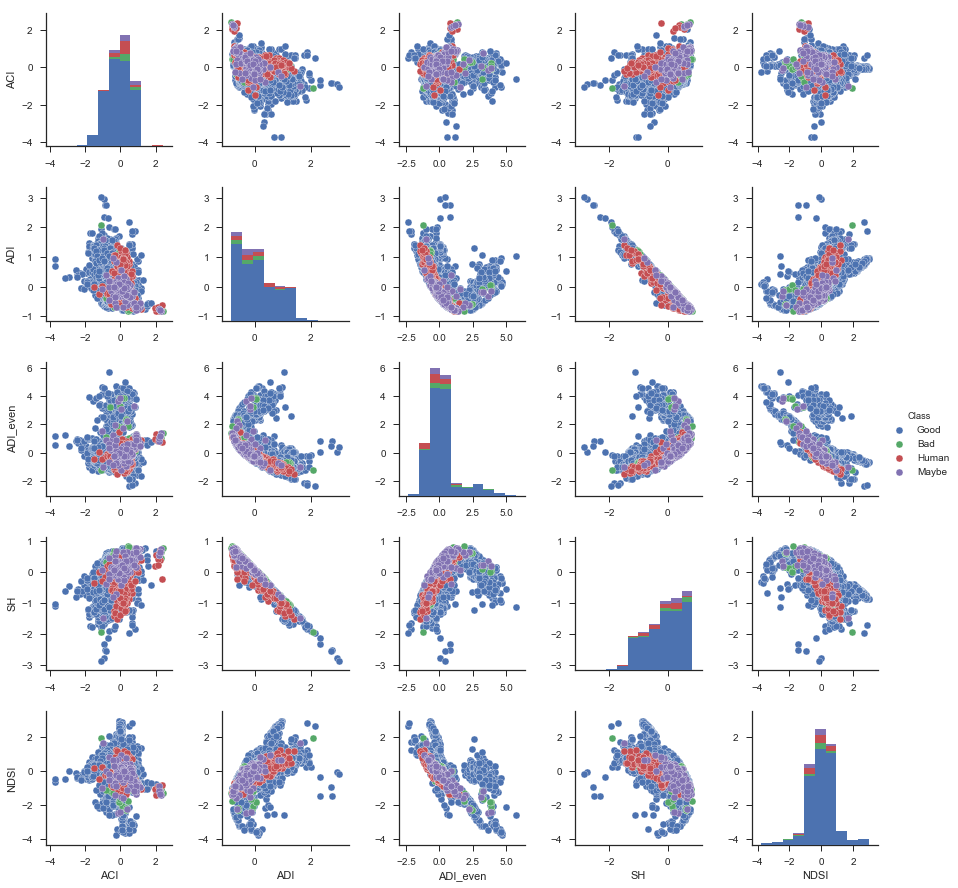

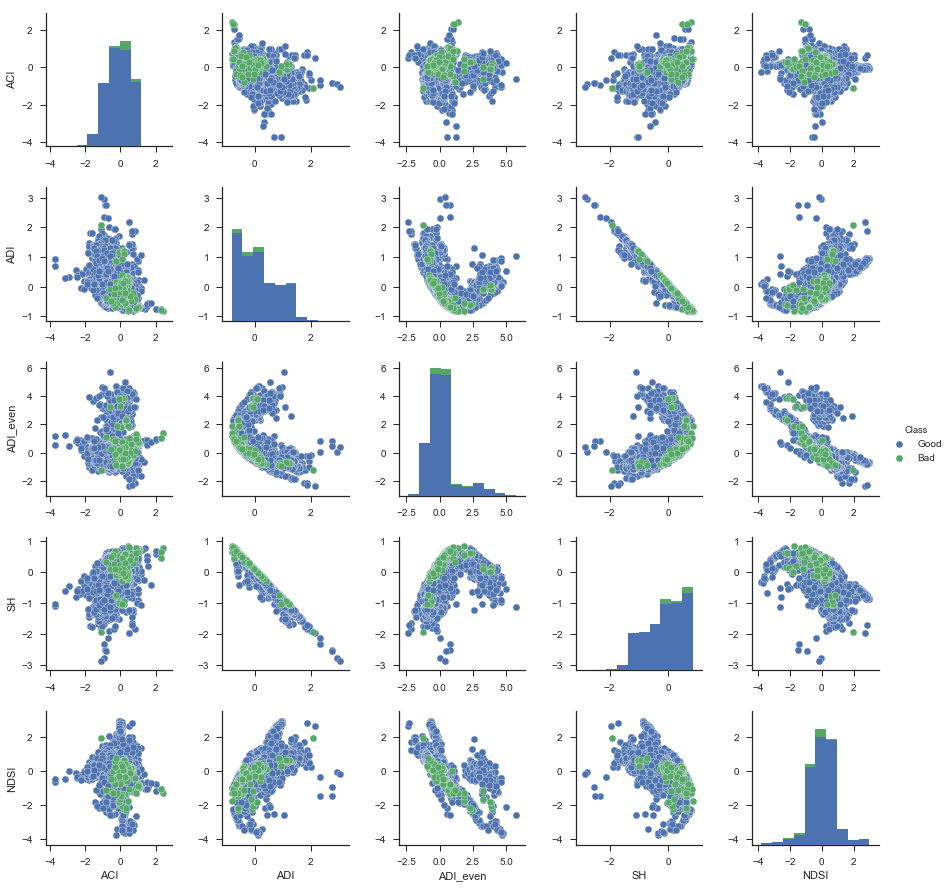

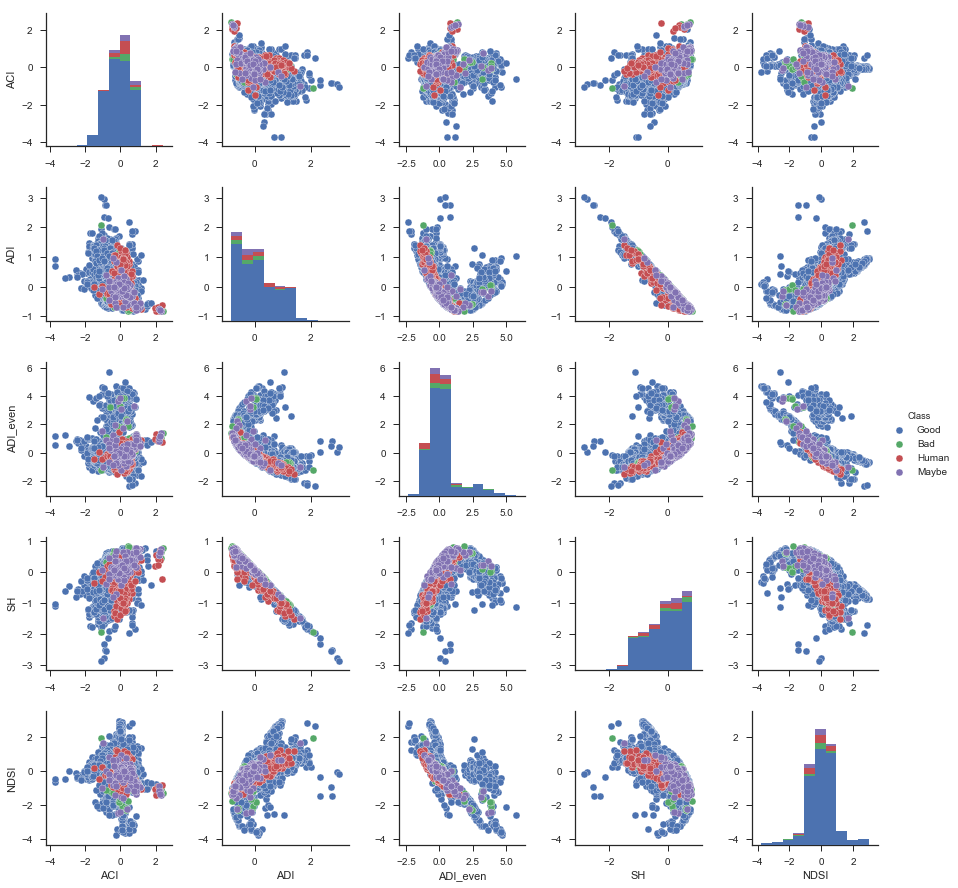

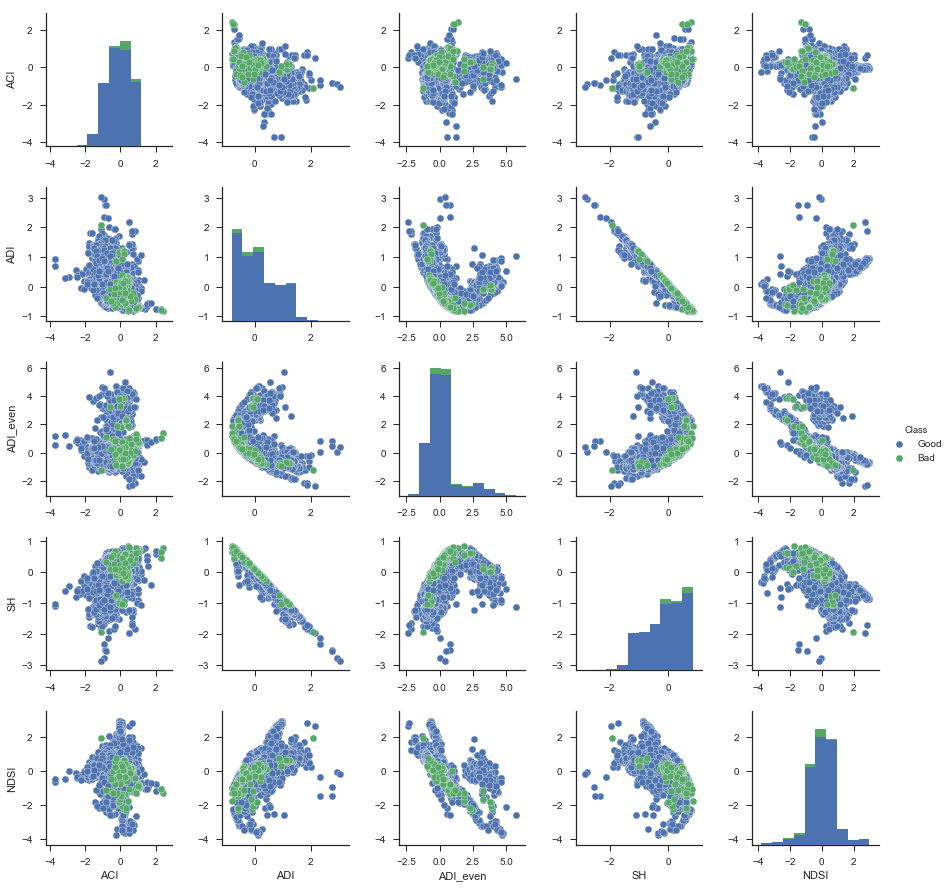

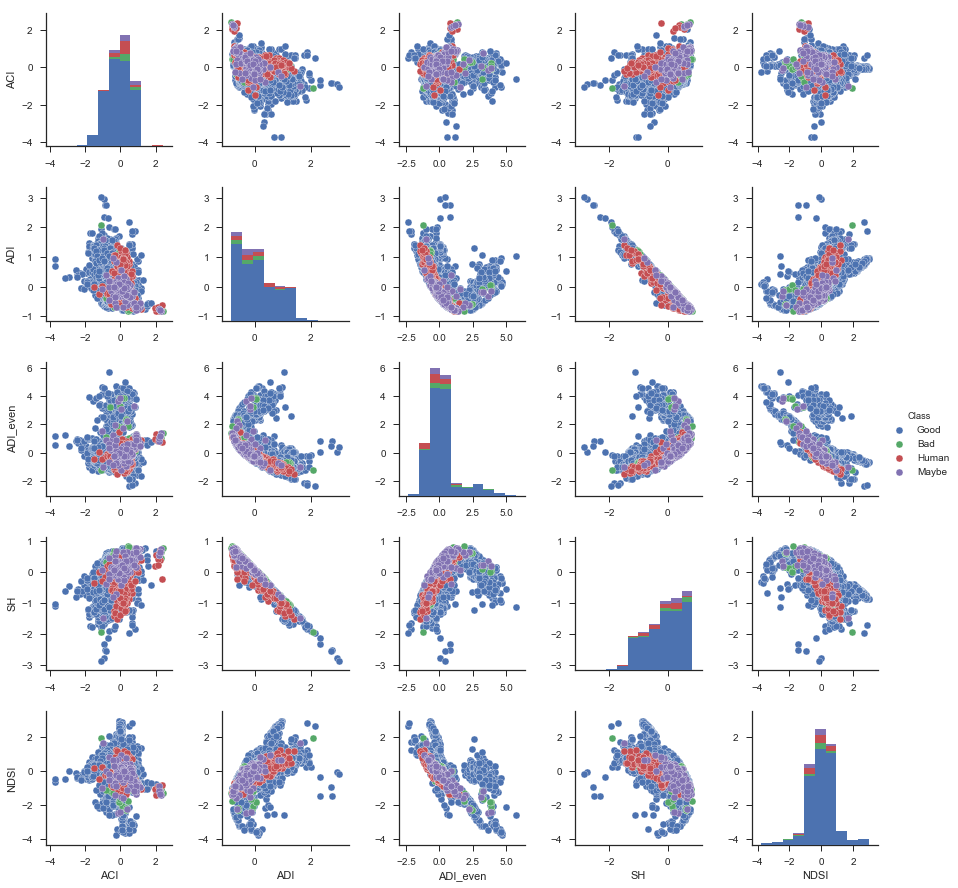

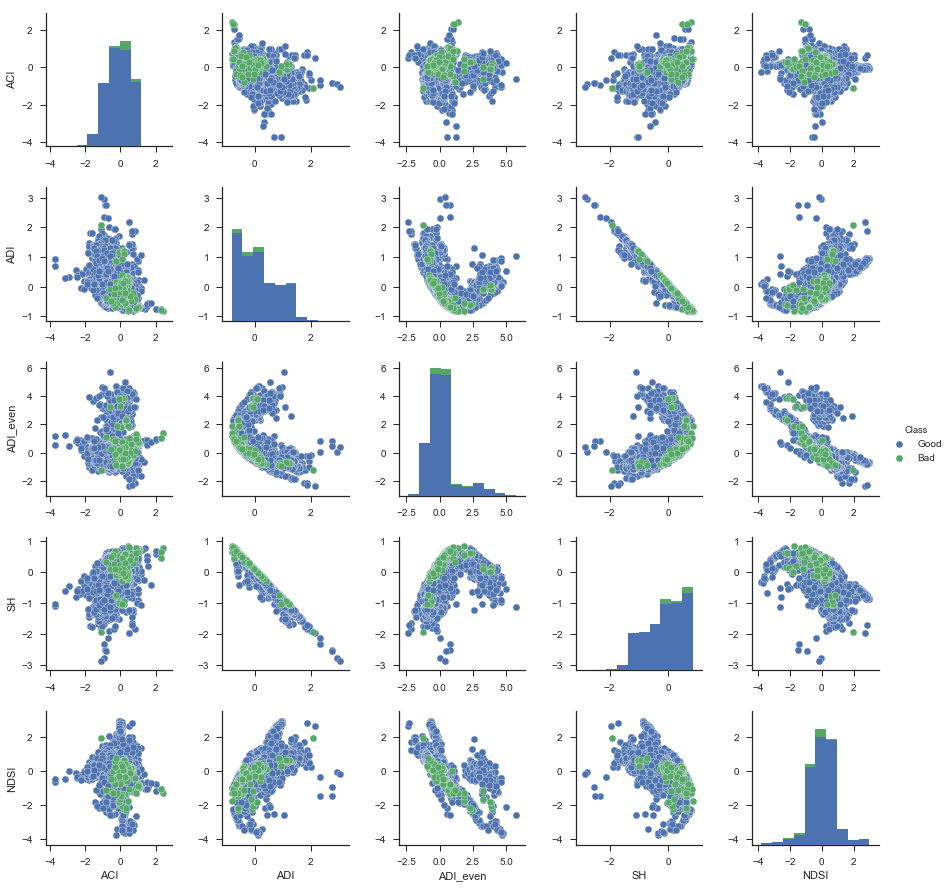

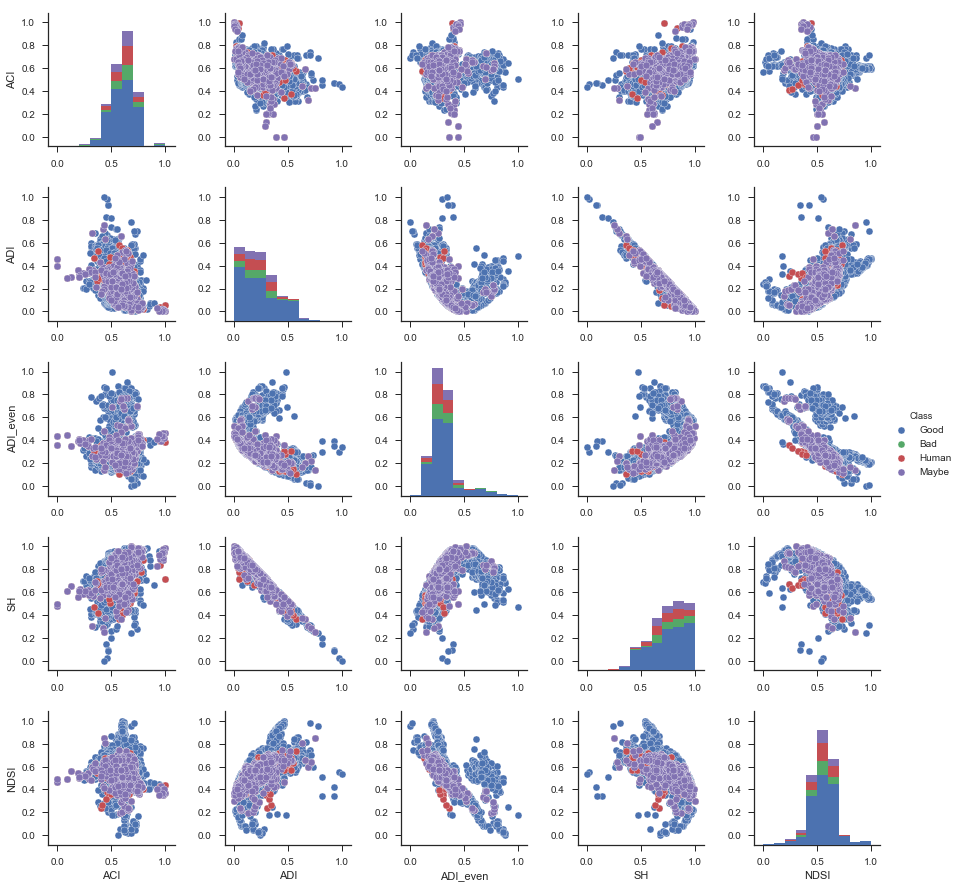

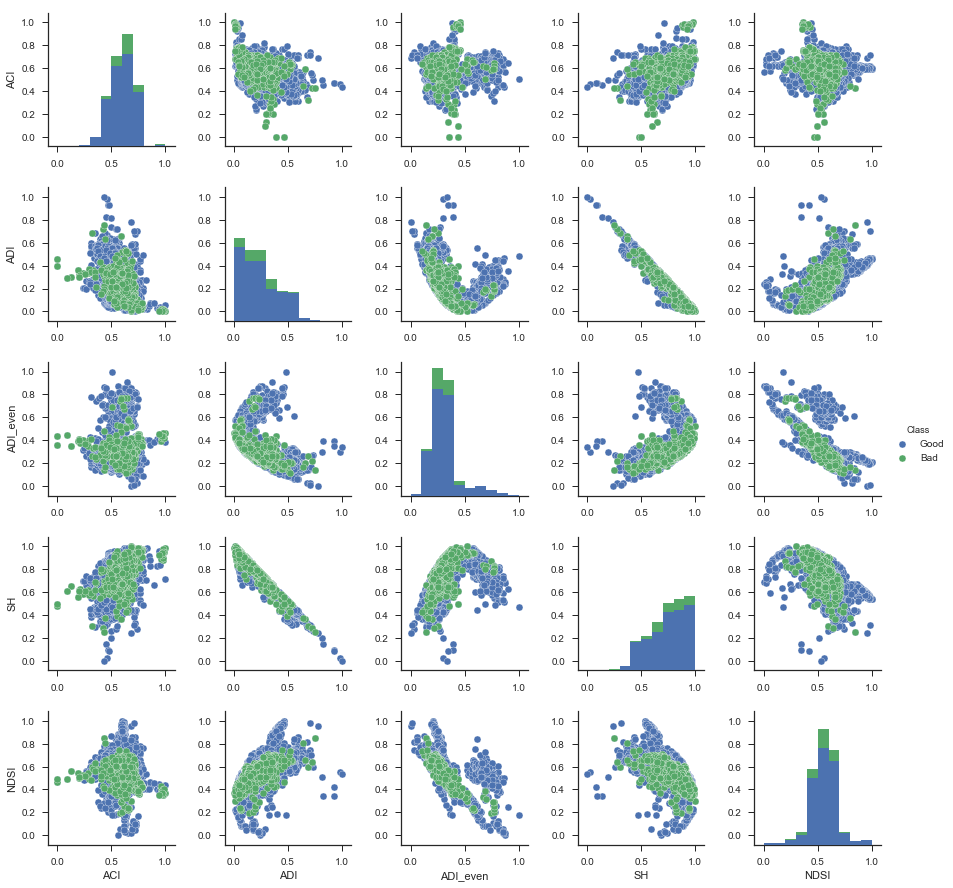

In [22]:
if (norm==1):
    all_df_sc1, all_df_sc2, all_df_sc3, all_df_sc4, gb_df_sc1, gb_df_sc2, gb_df_sc3, gb_df_sc4  = get_df_and_plot(norm, -1, ACI_G, ADI_G, ADI_even_G, SH_G, NDSI_G, num_specs_g, ACI_B, ADI_B, ADI_even_B, SH_B, NDSI_B, num_specs_b, ACI_H, ADI_H, ADI_even_H, SH_H, NDSI_H, num_specs_h, ACI_M, ADI_M, ADI_even_M, SH_M, NDSI_M, num_specs_m)
    

Displaying dataframe before scaling:


,ACI1,ADI1,ADI_even1,SH1,NDSI1,Class1
0,80.243286,-3.688047,-1.881208,88.359261,0.716630,Good
1,46.404182,-2.972167,-1.836112,93.825356,0.712668,Good
2,83.291245,-3.477021,-1.666841,92.698746,0.384758,Good
3,75.370430,-3.633843,-1.708756,102.503662,0.402326,Good
4,55.620201,-3.081301,-1.565449,89.164330,0.340162,Good


Displaying dataframe with standard scaling:


,ACI1,ADI1,ADI_even1,SH1,NDSI1,Class1
0,0.655374,-0.705712,-1.362299,-0.987674,0.977758,Good
1,-1.011978,0.680847,-1.224984,-0.866401,0.969020,Good
2,0.805555,-0.296983,-0.709558,-0.891396,0.245886,Good
3,0.415274,-0.600726,-0.837188,-0.673860,0.284627,Good
4,-0.557878,0.469470,-0.400822,-0.969812,0.147537,Good


Max value of each index:
ACI1         2.40572
ADI1         4.70195
ADI_even1    4.36594
SH1          2.42578
NDSI1        1.60267
Class1         Maybe
dtype: object
Min value of each index:
ACI1        -2.84042
ADI1        -1.66829
ADI_even1   -1.91624
SH1          -2.7352
NDSI1        -2.8079
Class1           Bad
dtype: object
Displaying dataframe with minmax scaling:


,ACI1,ADI1,ADI_even1,SH1,NDSI1,Class1
0,0.666356,0.151105,0.088176,0.338603,0.858315,Good
1,0.348532,0.368767,0.110034,0.362101,0.856334,Good
2,0.694983,0.215267,0.192080,0.357258,0.692379,Good
3,0.620589,0.167585,0.171764,0.399408,0.701163,Good
4,0.435091,0.335585,0.241225,0.342064,0.670081,Good


Max value of each index:
ACI1             1
ADI1             1
ADI_even1        1
SH1              1
NDSI1            1
Class1       Maybe
dtype: object
Min value of each index:
ACI1           0
ADI1           0
ADI_even1      0
SH1            0
NDSI1          0
Class1       Bad
dtype: object
Displaying dataframe with robust scaling:


,ACI1,ADI1,ADI_even1,SH1,NDSI1,Class1
0,0.466637,-0.471697,-0.916852,-0.660827,0.657541,Good
1,-0.665358,0.711476,-0.817058,-0.579683,0.651752,Good
2,0.568598,-0.122922,-0.442473,-0.596408,0.172744,Good
3,0.303629,-0.382111,-0.535227,-0.450854,0.198406,Good
4,-0.357061,0.531105,-0.218099,-0.648876,0.107597,Good


Max value of each index:
ACI1         1.65497
ADI1         4.14275
ADI_even1    3.24614
SH1          1.62312
NDSI1        1.07149
Class1         Maybe
dtype: object
Min value of each index:
ACI1        -1.90672
ADI1        -1.29308
ADI_even1   -1.31943
SH1          -1.8301
NDSI1        -1.8501
Class1           Bad
dtype: object
Displaying dataframe with maxabs scaling:


,ACI1,ADI1,ADI_even1,SH1,NDSI1,Class1
0,0.666356,0.151105,0.088176,0.338603,0.858315,Good
0,0.666356,0.151105,0.088176,0.338603,0.858315,Bad
0,0.666356,0.151105,0.088176,0.338603,0.858315,Human
0,0.666356,0.151105,0.088176,0.338603,0.858315,Maybe
0,0.791955,0.096981,0.158679,0.890992,0.740582,Good


Max value of each index:
ACI1             1
ADI1             1
ADI_even1        1
SH1              1
NDSI1            1
Class1       Maybe
dtype: object
Min value of each index:
ACI1           0
ADI1           0
ADI_even1      0
SH1            0
NDSI1          0
Class1       Bad
dtype: object


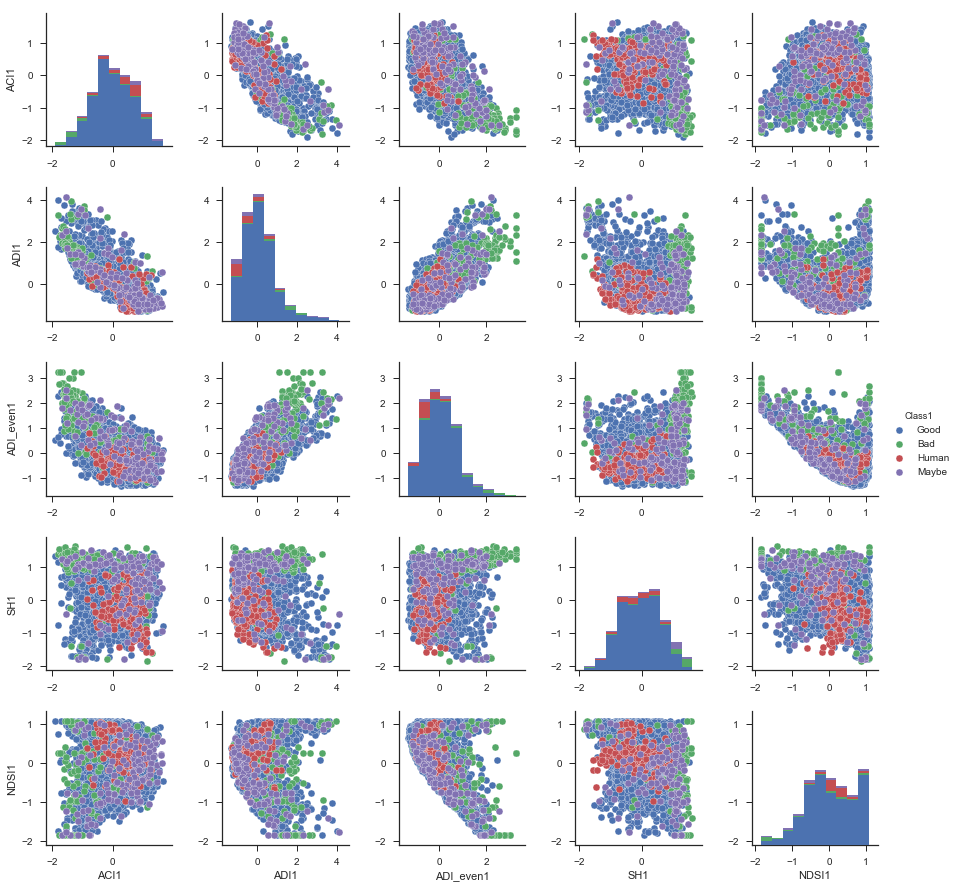

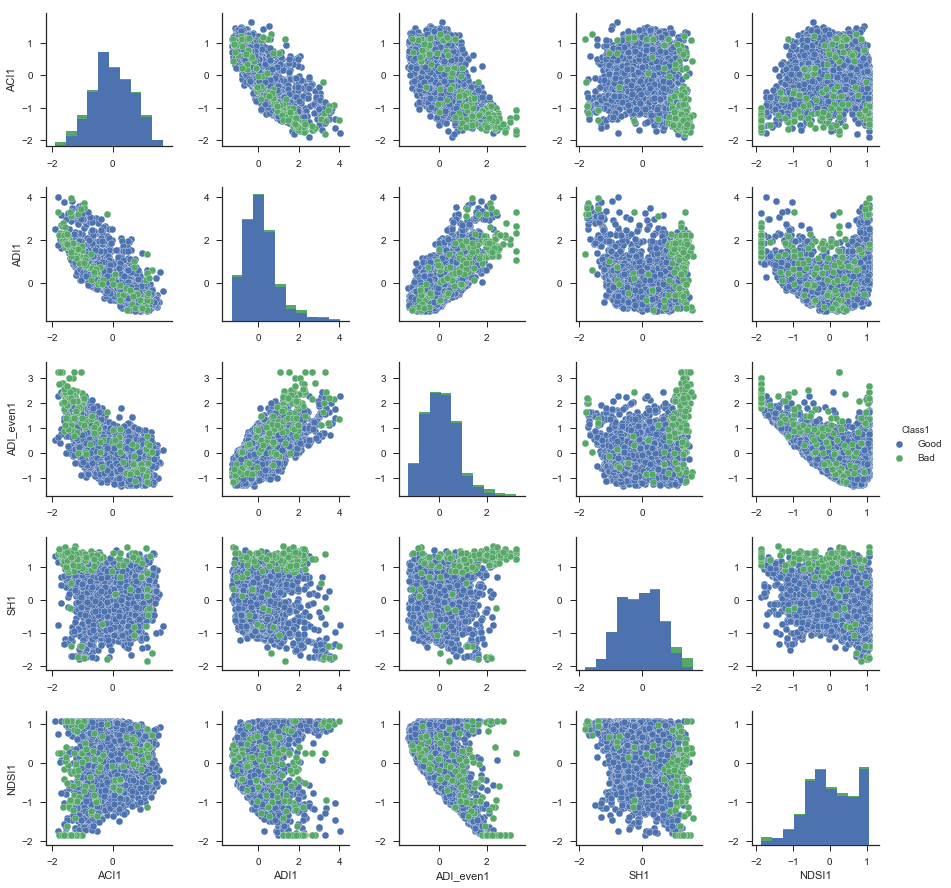

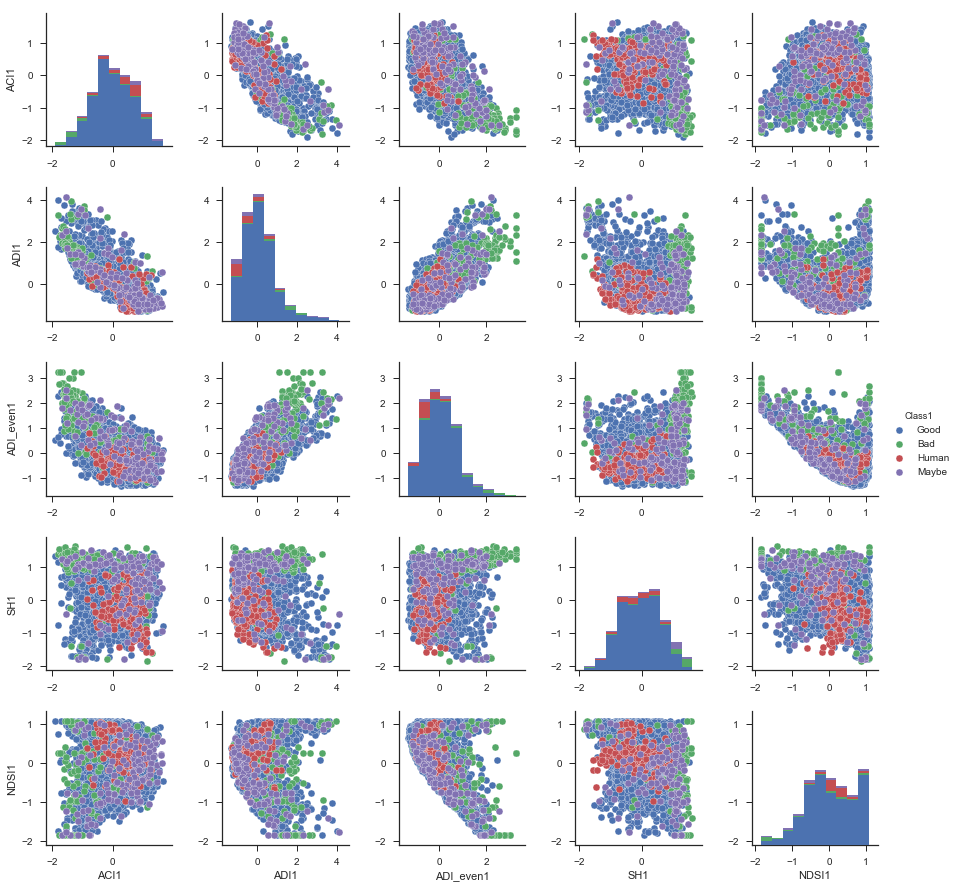

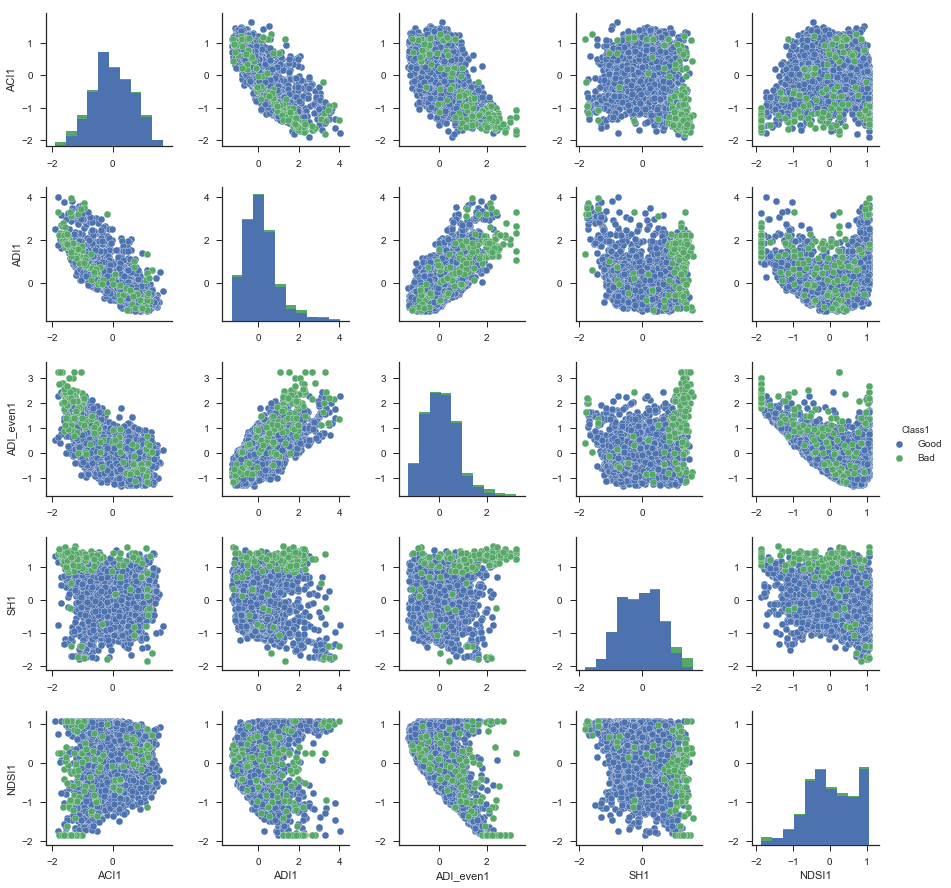

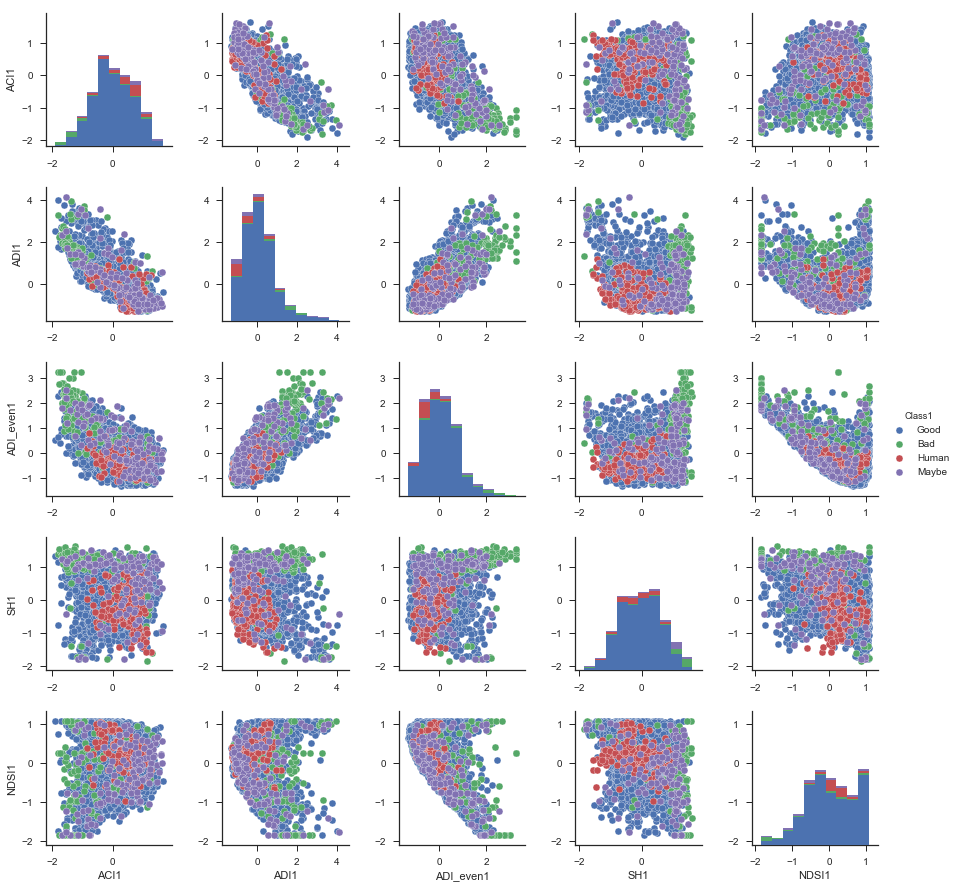

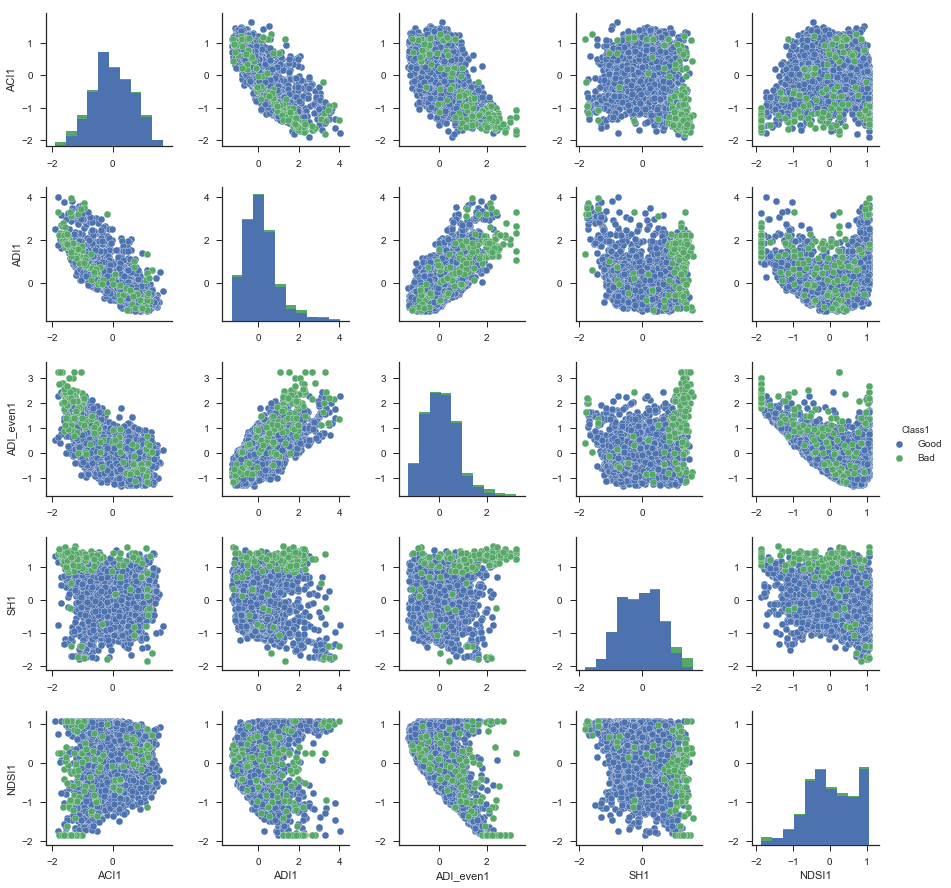

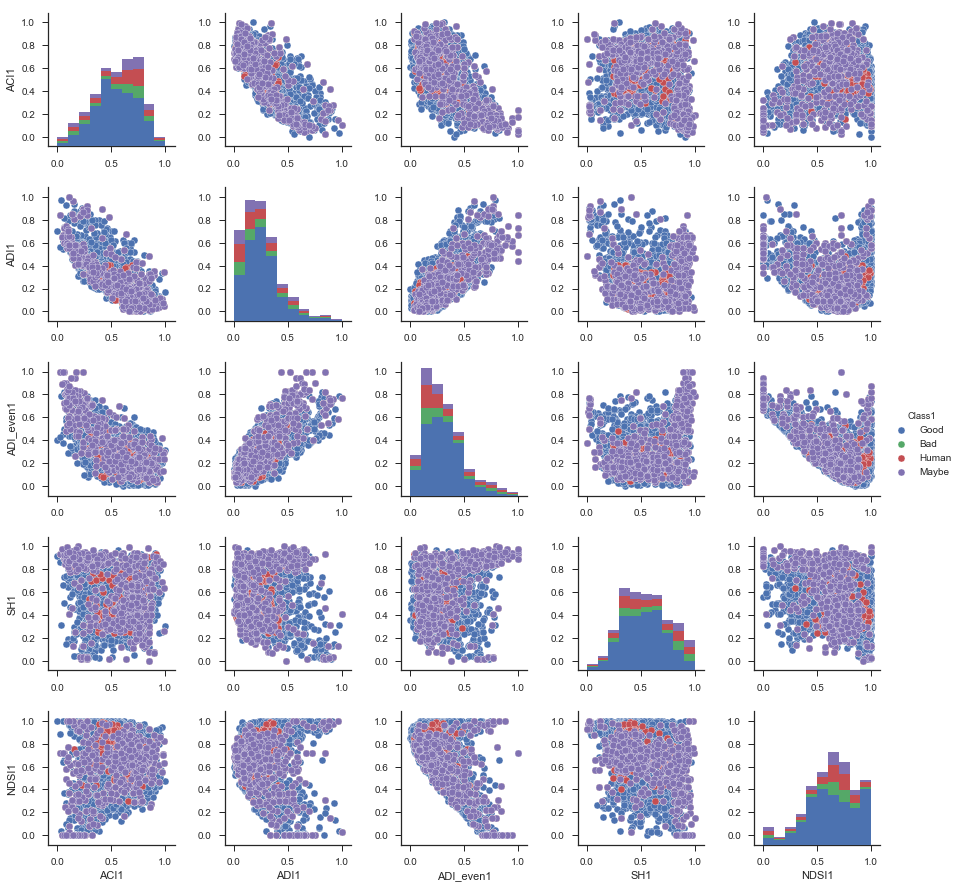

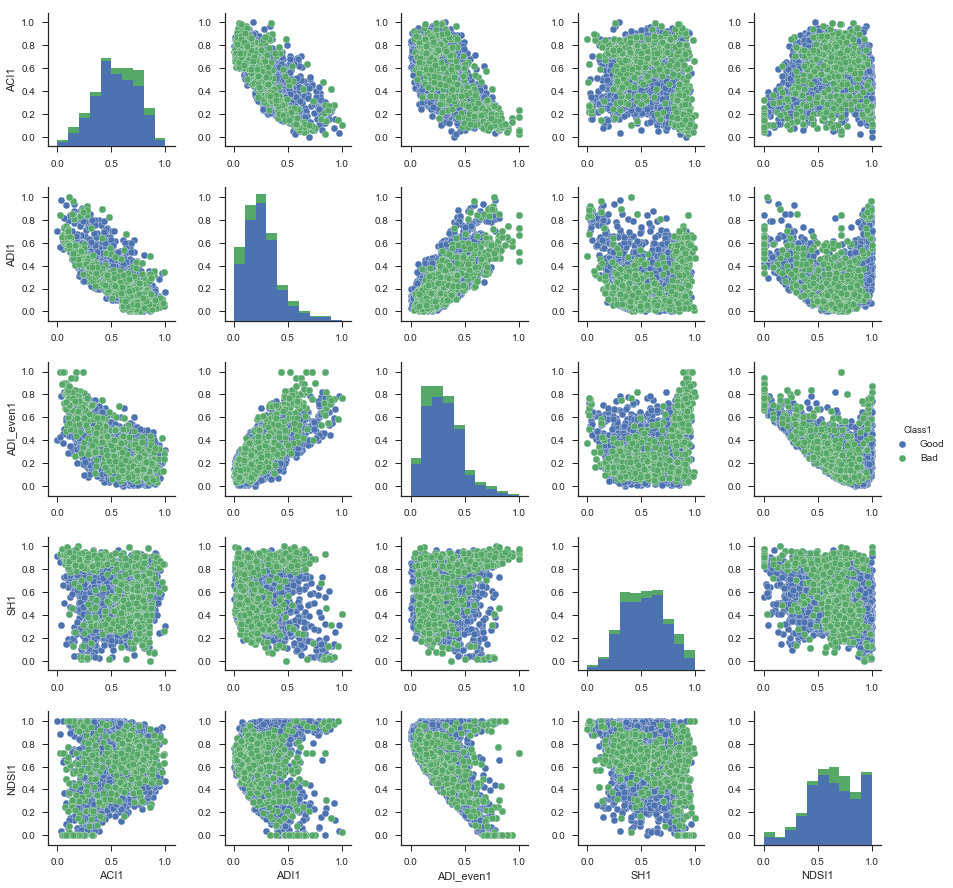

In [23]:
if (norm==1):
    all_df1_sc1, all_df1_sc2, all_df1_sc3, all_df1_sc4, gb_df1_sc1, gb_df1_sc2, gb_df1_sc3, gb_df1_sc4 = get_df_and_plot(norm, 1, ACI_G1, ADI_G1, ADI_even_G1, SH_G1, NDSI_G1, num_specs_g, ACI_B1, ADI_B1, ADI_even_B1, SH_B1, NDSI_B1, num_specs_b, ACI_H1, ADI_H1, ADI_even_H1, SH_H1, NDSI_H1, num_specs_h, ACI_M1, ADI_M1, ADI_even_M1, SH_M1, NDSI_M1, num_specs_m)
    

Displaying dataframe before scaling:


,ACI2,ADI2,ADI_even2,SH2,NDSI2,Class2
0,73.463295,-3.750207,-1.699613,117.615562,0.642533,Good
1,42.930161,-2.982163,-1.593020,112.048203,0.658904,Good
2,68.120468,-3.231578,-1.399250,84.859634,0.348327,Good
3,66.747864,-3.226775,-1.552843,108.506966,0.374880,Good
4,39.435158,-2.995456,-1.500386,103.042664,0.238124,Good


Displaying dataframe with standard scaling:


,ACI2,ADI2,ADI_even2,SH2,NDSI2,Class2
0,0.916940,-0.986359,-0.931004,0.043424,0.805834,Good
1,-0.743029,0.344107,-0.633207,-0.068183,0.840548,Good
2,0.626471,-0.087949,-0.091856,-0.613222,0.182013,Good
3,0.551848,-0.079629,-0.520962,-0.139172,0.238316,Good
4,-0.933039,0.321081,-0.374406,-0.248713,-0.051656,Good


Max value of each index:
ACI2         2.49357
ADI2         4.10542
ADI_even2    3.70237
SH2          2.61272
NDSI2        1.56379
Class2         Maybe
dtype: object
Min value of each index:
ACI2        -2.53434
ADI2        -1.72476
ADI_even2   -1.91656
SH2         -2.19942
NDSI2       -2.67692
Class2           Bad
dtype: object
Displaying dataframe with minmax scaling:


,ACI2,ADI2,ADI_even2,SH2,NDSI2,Class2
0,0.686424,0.126651,0.175399,0.466081,0.821266,Good
1,0.356273,0.354854,0.228398,0.442888,0.829452,Good
2,0.628652,0.280747,0.324742,0.329625,0.674163,Good
3,0.613810,0.282175,0.248374,0.428136,0.687440,Good
4,0.318481,0.350905,0.274457,0.405372,0.619062,Good


Max value of each index:
ACI2             1
ADI2             1
ADI_even2        1
SH2              1
NDSI2            1
Class2       Maybe
dtype: object
Min value of each index:
ACI2           0
ADI2           0
ADI_even2      0
SH2            0
NDSI2          0
Class2       Bad
dtype: object
Displaying dataframe with robust scaling:


,ACI2,ADI2,ADI_even2,SH2,NDSI2,Class2
0,0.594954,-0.753144,-0.632097,0.202624,0.477638,Good
1,-0.523604,0.399741,-0.406855,0.126520,0.499512,Good
2,0.399223,0.025352,0.002602,-0.245141,0.084552,Good
3,0.348939,0.032562,-0.321958,0.078112,0.120030,Good
4,-0.651641,0.379788,-0.211108,0.003416,-0.062689,Good


Max value of each index:
ACI2          1.65736
ADI2          3.65902
ADI_even2     2.87241
SH2           1.95462
NDSI2        0.955246
Class2          Maybe
dtype: object
Min value of each index:
ACI2        -1.73066
ADI2        -1.39299
ADI_even2   -1.37753
SH2         -1.32677
NDSI2       -1.71693
Class2           Bad
dtype: object
Displaying dataframe with maxabs scaling:


,ACI2,ADI2,ADI_even2,SH2,NDSI2,Class2
0,0.686424,0.126651,0.175399,0.466081,0.821266,Good
0,0.686424,0.126651,0.175399,0.466081,0.821266,Bad
0,0.686424,0.126651,0.175399,0.466081,0.821266,Human
0,0.686424,0.126651,0.175399,0.466081,0.821266,Maybe
0,0.484434,0.221738,0.253891,0.832641,0.682690,Good


Max value of each index:
ACI2             1
ADI2             1
ADI_even2        1
SH2              1
NDSI2            1
Class2       Maybe
dtype: object
Min value of each index:
ACI2           0
ADI2           0
ADI_even2      0
SH2            0
NDSI2          0
Class2       Bad
dtype: object


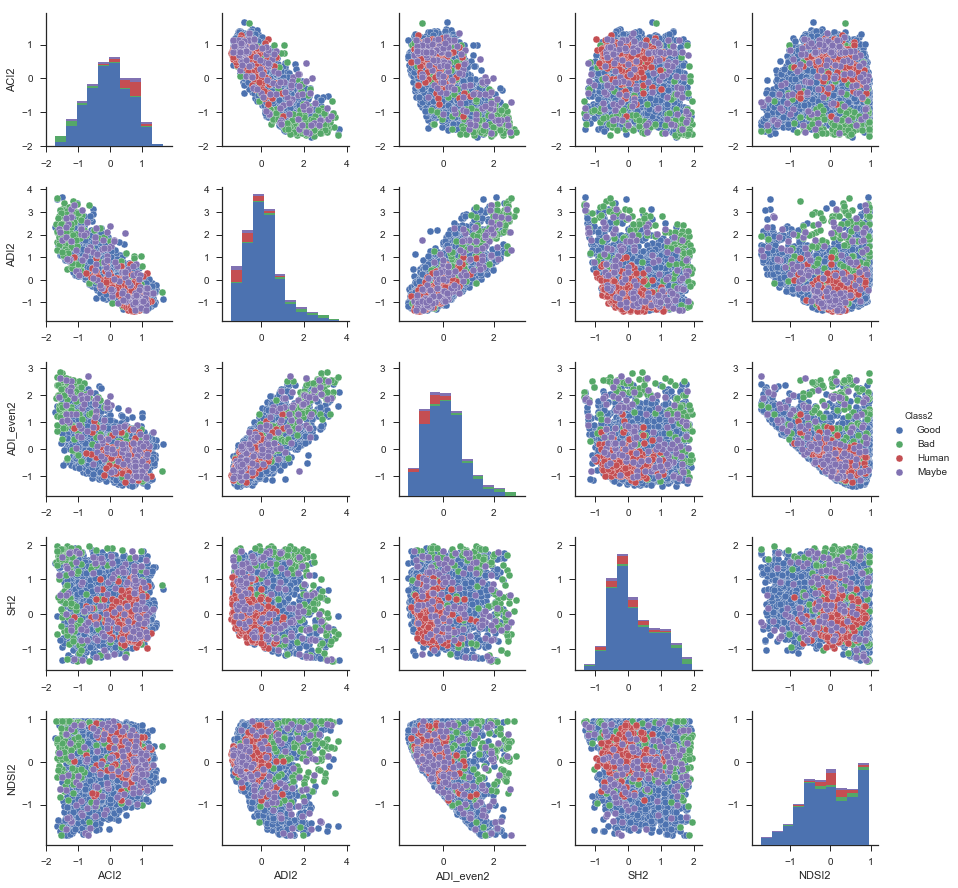

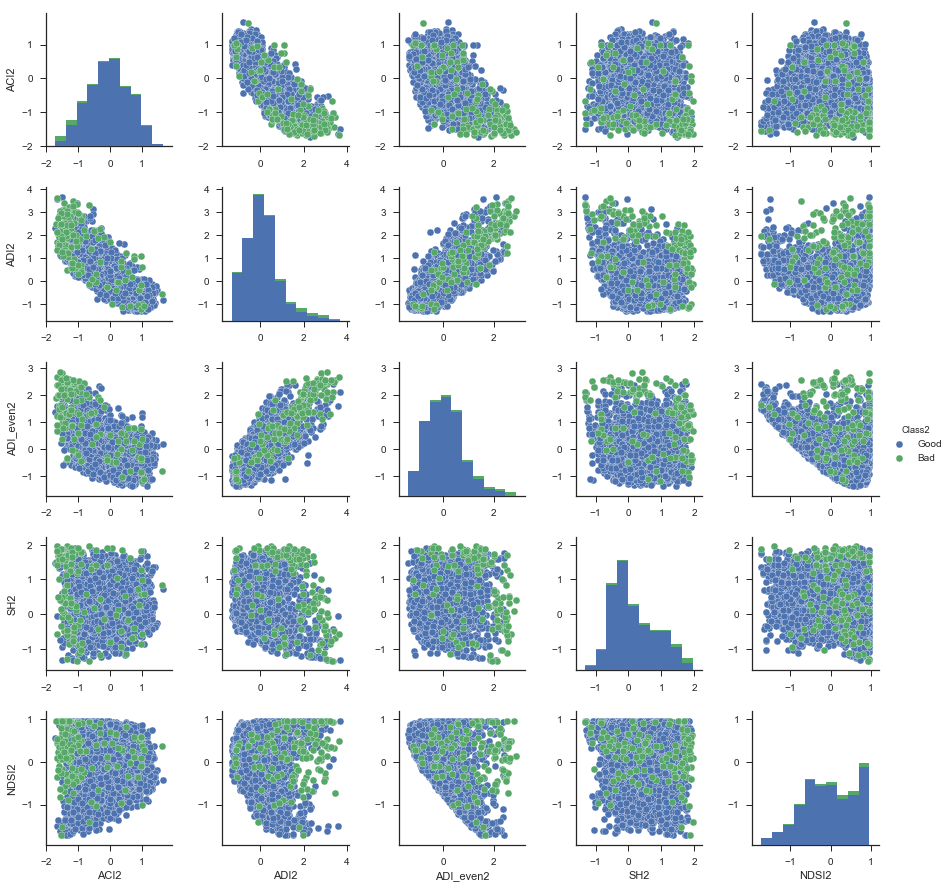

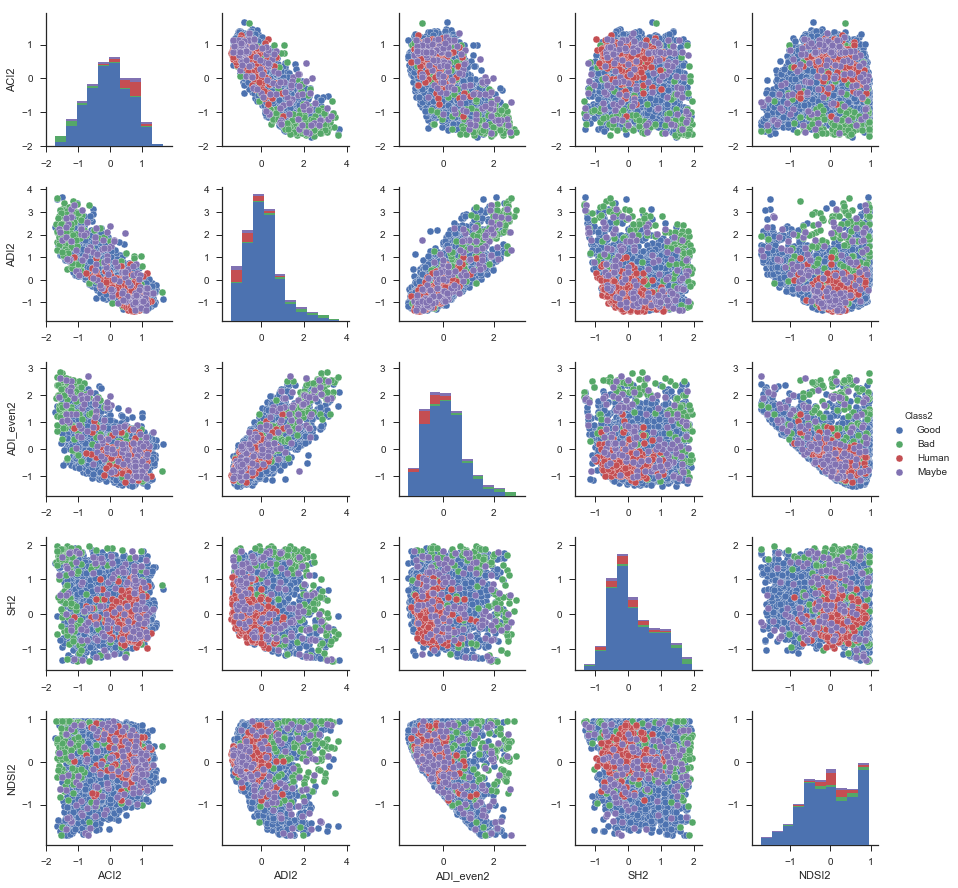

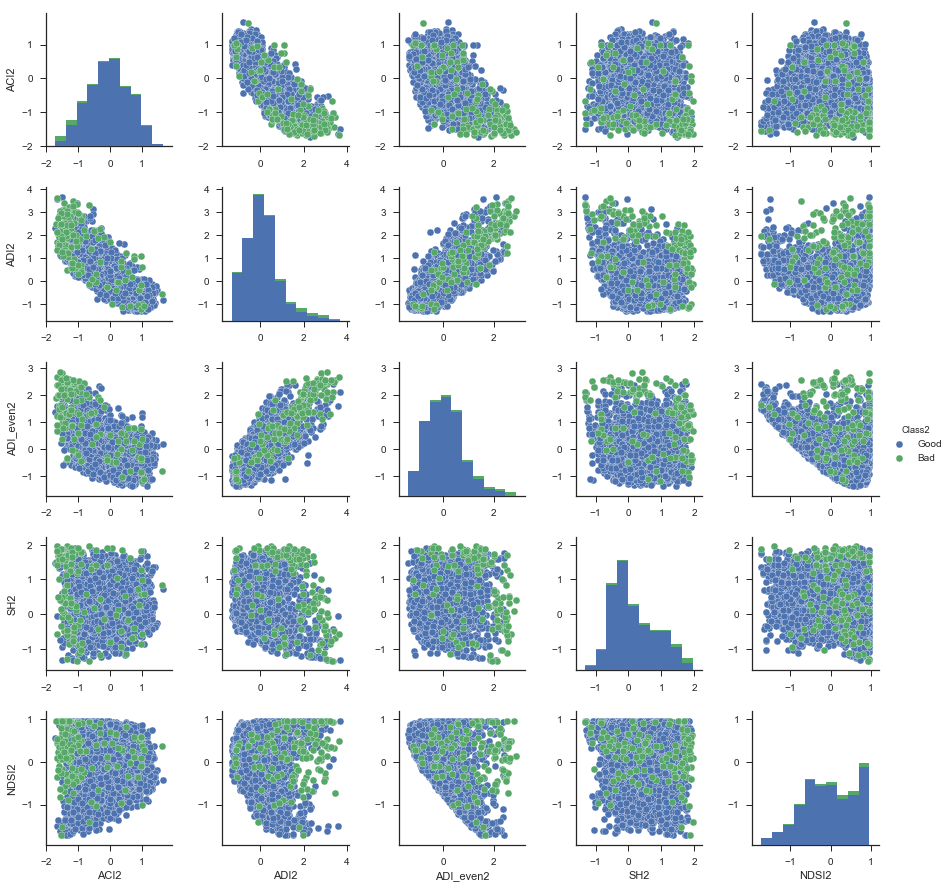

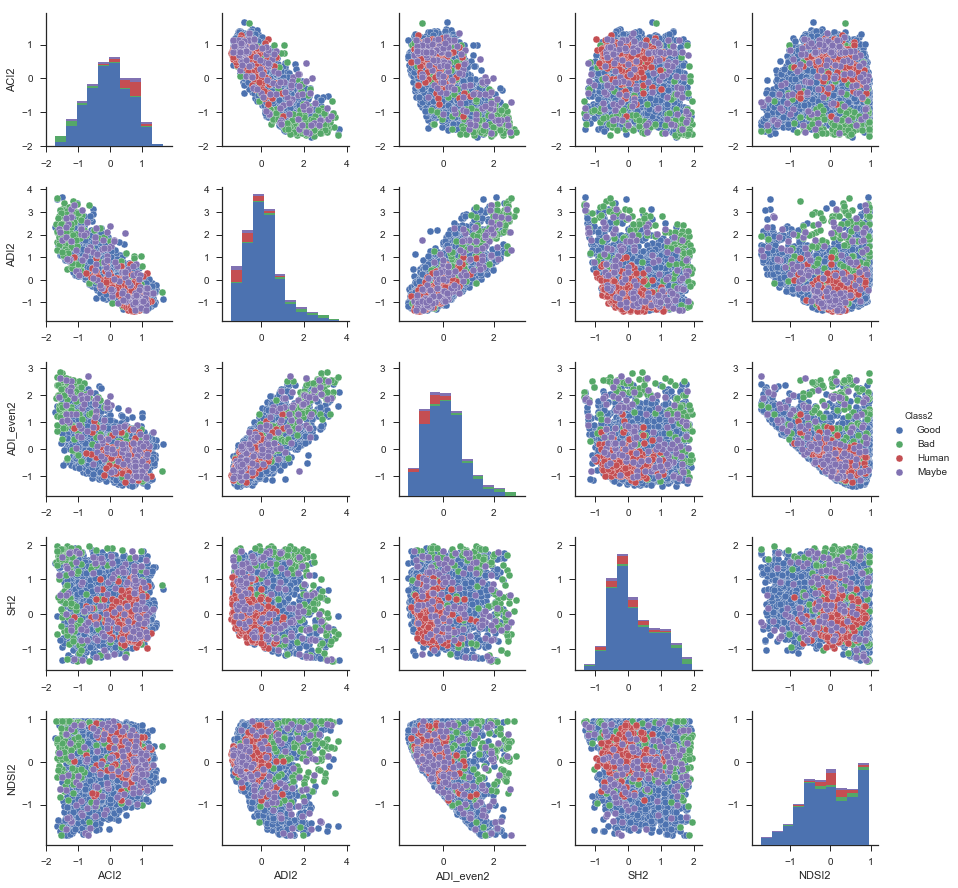

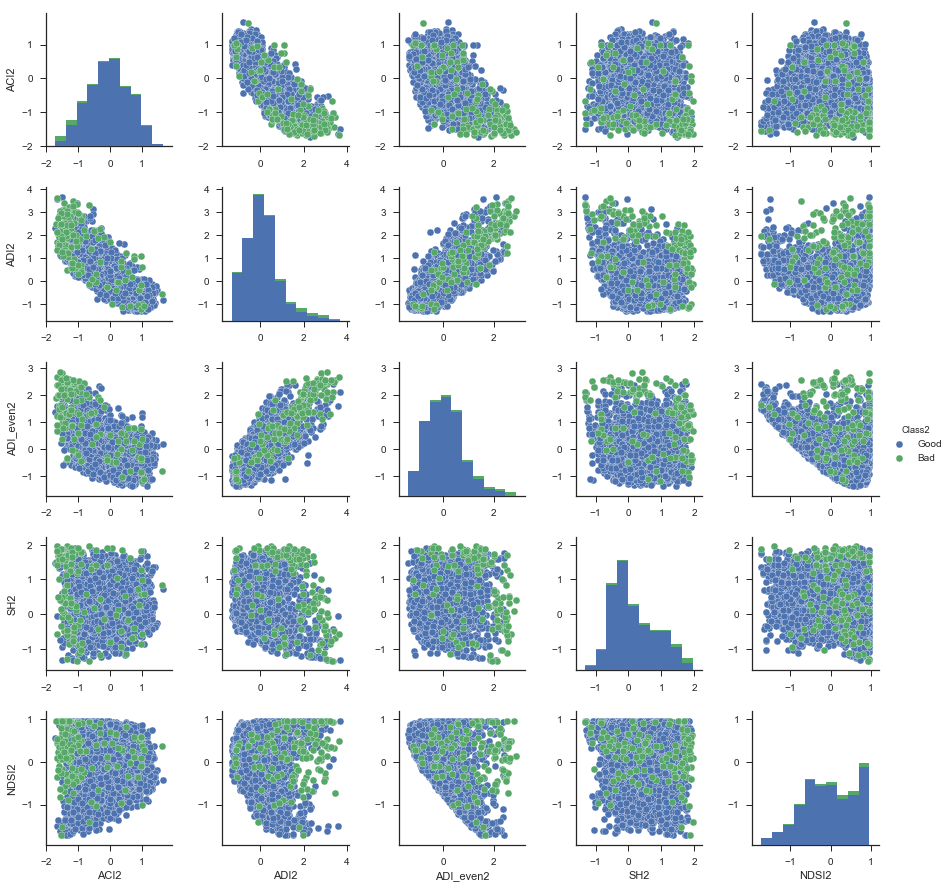

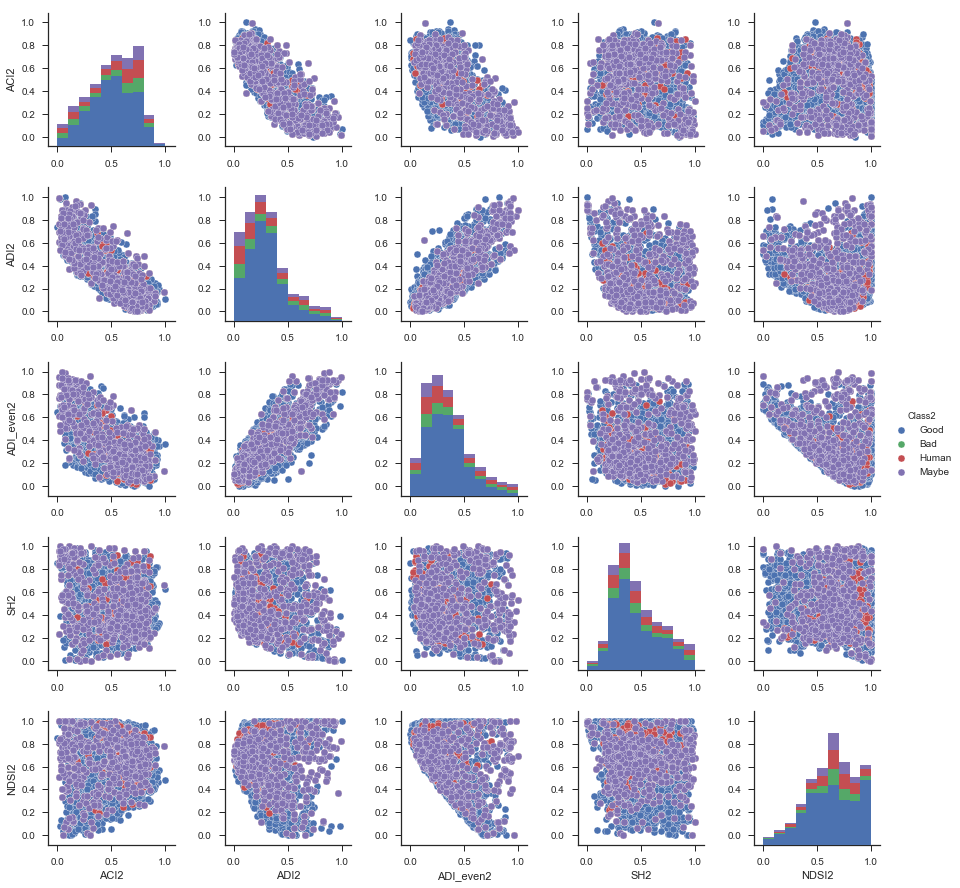

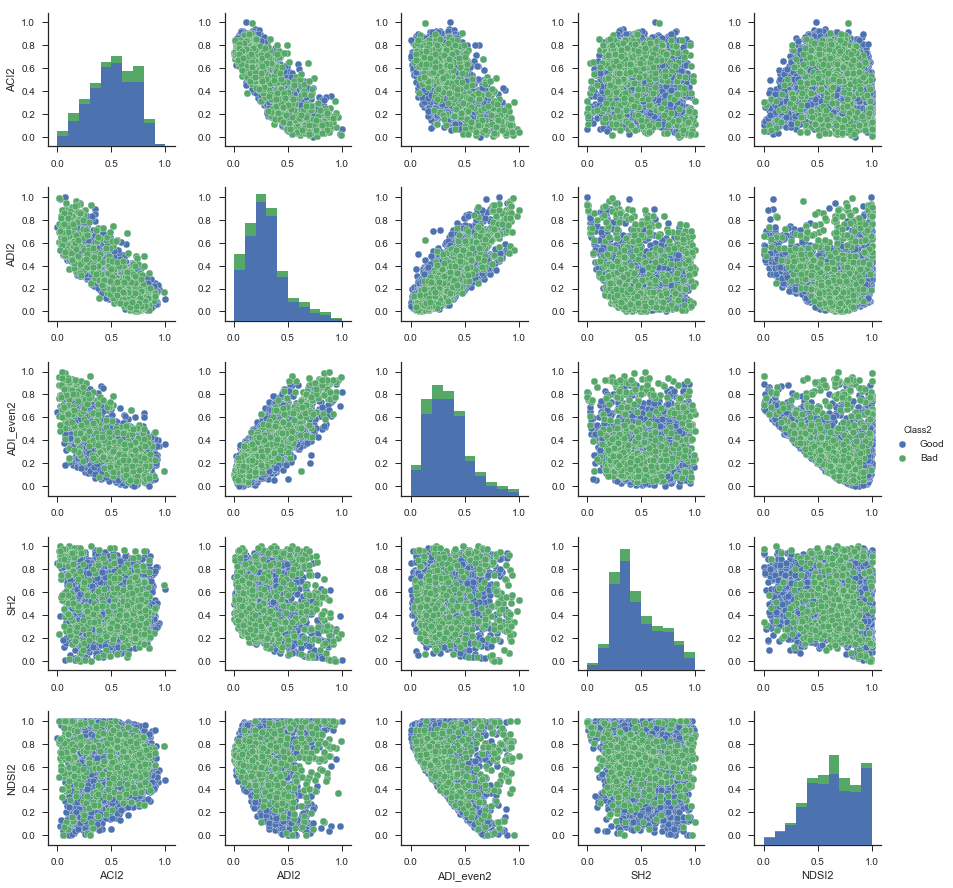

In [24]:
if (norm==1):
    all_df2_sc1, all_df2_sc2, all_df2_sc3, all_df2_sc4, gb_df2_sc1, gb_df2_sc2, gb_df2_sc3, gb_df2_sc4 = get_df_and_plot(norm, 2, ACI_G2, ADI_G2, ADI_even_G2, SH_G2, NDSI_G2, num_specs_g, ACI_B2, ADI_B2, ADI_even_B2, SH_B2, NDSI_B2, num_specs_b, ACI_H2, ADI_H2, ADI_even_H2, SH_H2, NDSI_H2, num_specs_h, ACI_M2, ADI_M2, ADI_even_M2, SH_M2, NDSI_M2, num_specs_m)


Displaying dataframe before scaling:


,ACI3,ADI3,ADI_even3,SH3,NDSI3,Class3
0,14.915400,-2.769238,-1.045067,119.389130,-0.220427,Good
1,24.042746,-2.937176,-0.927017,125.993927,-0.586986,Good
2,17.981171,-3.126218,-0.878492,133.952087,0.815964,Good
3,18.301636,-3.218222,-1.047065,137.326294,0.751245,Good
4,16.717373,-3.240785,-1.292281,128.013458,0.554435,Good


Displaying dataframe with standard scaling:


,ACI3,ADI3,ADI_even3,SH3,NDSI3,Class3
0,0.265080,-0.216223,-0.132221,-0.447646,-0.643298,Good
1,2.139448,-0.593857,0.177254,-0.266501,-1.200596,Good
2,0.894659,-1.018949,0.304466,-0.048238,0.932374,Good
3,0.960469,-1.225833,-0.137457,0.044304,0.833979,Good
4,0.635129,-1.276570,-0.780307,-0.211113,0.534759,Good


Max value of each index:
ACI3         4.25246
ADI3         5.18898
ADI_even3    2.60748
SH3          2.99739
NDSI3        1.21217
Class3         Maybe
dtype: object
Min value of each index:
ACI3        -2.61992
ADI3        -2.94686
ADI_even3    -2.4814
SH3         -2.08606
NDSI3       -1.82852
Class3           Bad
dtype: object
Displaying dataframe with minmax scaling:


,ACI3,ADI3,ADI_even3,SH3,NDSI3,Class3
0,0.419796,0.335631,0.461630,0.322303,0.389787,Good
1,0.692535,0.289214,0.522443,0.357937,0.206507,Good
2,0.511406,0.236965,0.547441,0.400873,0.907982,Good
3,0.520982,0.211536,0.460601,0.419078,0.875622,Good
4,0.473642,0.205300,0.334276,0.368833,0.777217,Good


Max value of each index:
ACI3             1
ADI3             1
ADI_even3        1
SH3              1
NDSI3            1
Class3       Maybe
dtype: object
Min value of each index:
ACI3           0
ADI3           0
ADI_even3      0
SH3            0
NDSI3          0
Class3       Bad
dtype: object
Displaying dataframe with robust scaling:


,ACI3,ADI3,ADI_even3,SH3,NDSI3,Class3
0,0.251673,-0.090378,-0.001988,-0.129658,-0.487631,Good
1,1.691600,-0.429949,0.258440,0.026882,-0.807608,Good
2,0.735328,-0.812193,0.365491,0.215499,0.417053,Good
3,0.785885,-0.998225,-0.006395,0.295471,0.360559,Good
4,0.535952,-1.043848,-0.547363,0.074747,0.188760,Good


Max value of each index:
ACI3          3.31486
ADI3          4.77001
ADI_even3     2.30352
SH3           2.84744
NDSI3        0.577702
Class3          Maybe
dtype: object
Min value of each index:
ACI3        -1.96464
ADI3        -2.54578
ADI_even3   -1.97886
SH3         -1.54553
NDSI3       -1.16814
Class3           Bad
dtype: object
Displaying dataframe with maxabs scaling:


,ACI3,ADI3,ADI_even3,SH3,NDSI3,Class3
0,0.419796,0.335631,0.461630,0.322303,0.389787,Good
0,0.419796,0.335631,0.461630,0.322303,0.389787,Bad
0,0.419796,0.335631,0.461630,0.322303,0.389787,Human
0,0.419796,0.335631,0.461630,0.322303,0.389787,Maybe
0,0.296314,0.545019,0.649487,0.726618,0.846472,Good


Max value of each index:
ACI3             1
ADI3             1
ADI_even3        1
SH3              1
NDSI3            1
Class3       Maybe
dtype: object
Min value of each index:
ACI3           0
ADI3           0
ADI_even3      0
SH3            0
NDSI3          0
Class3       Bad
dtype: object


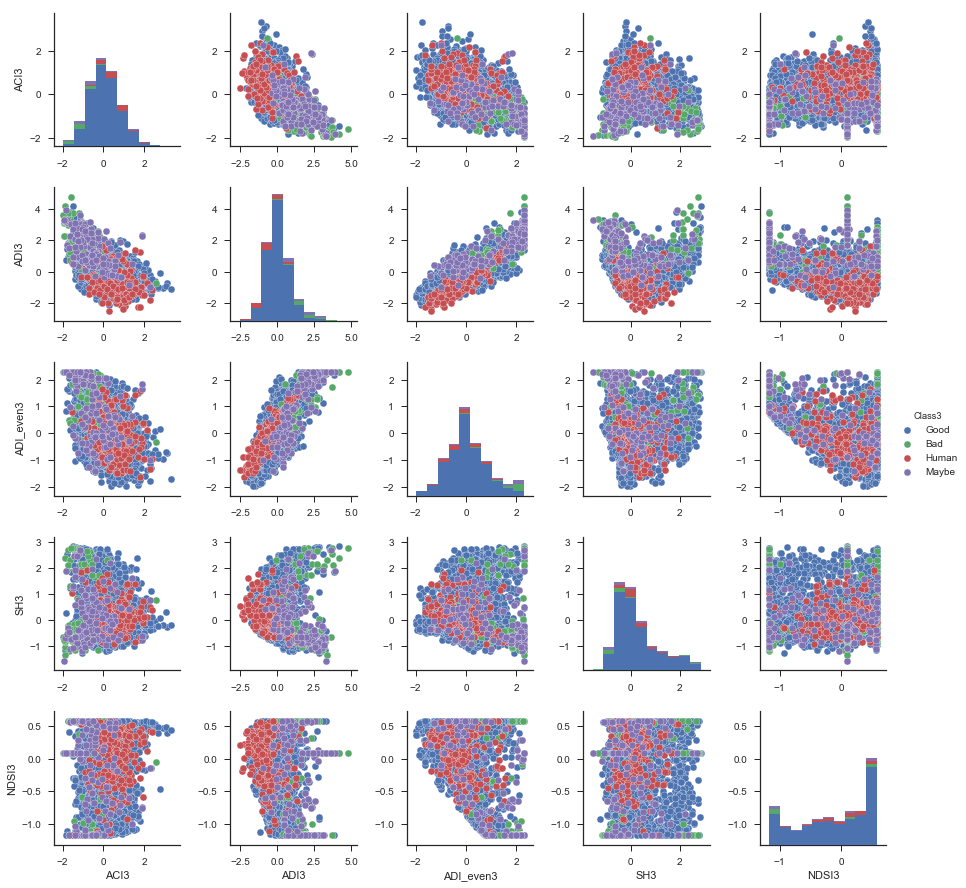

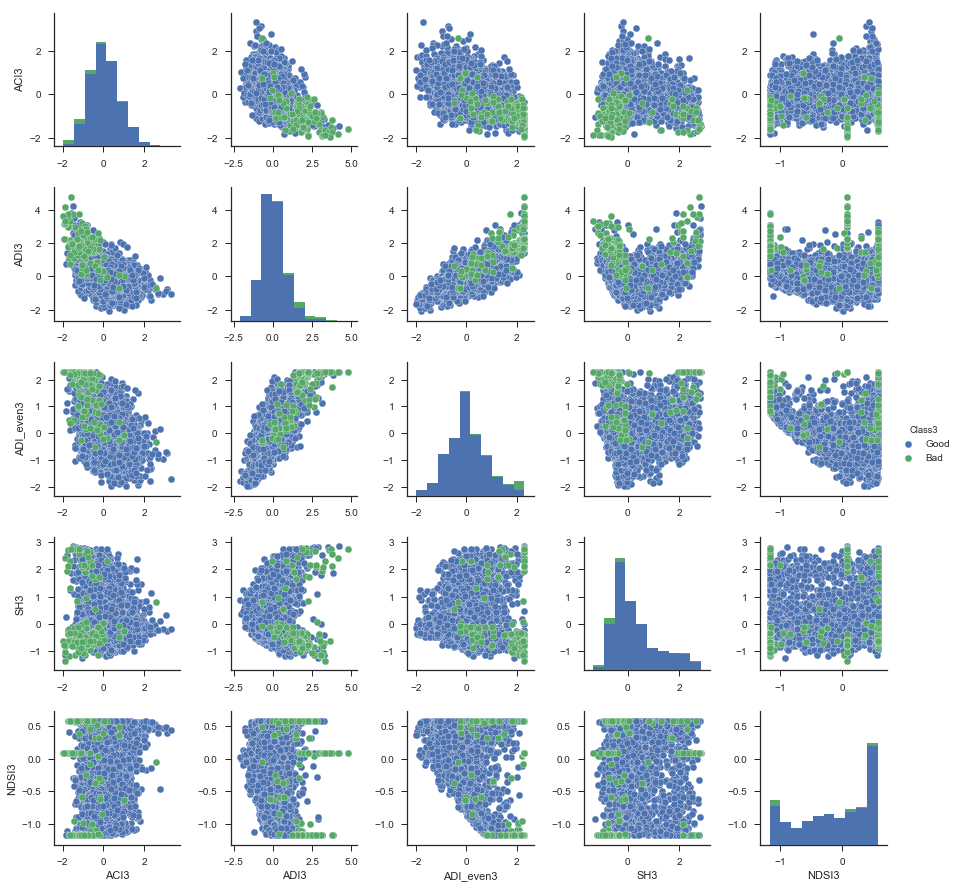

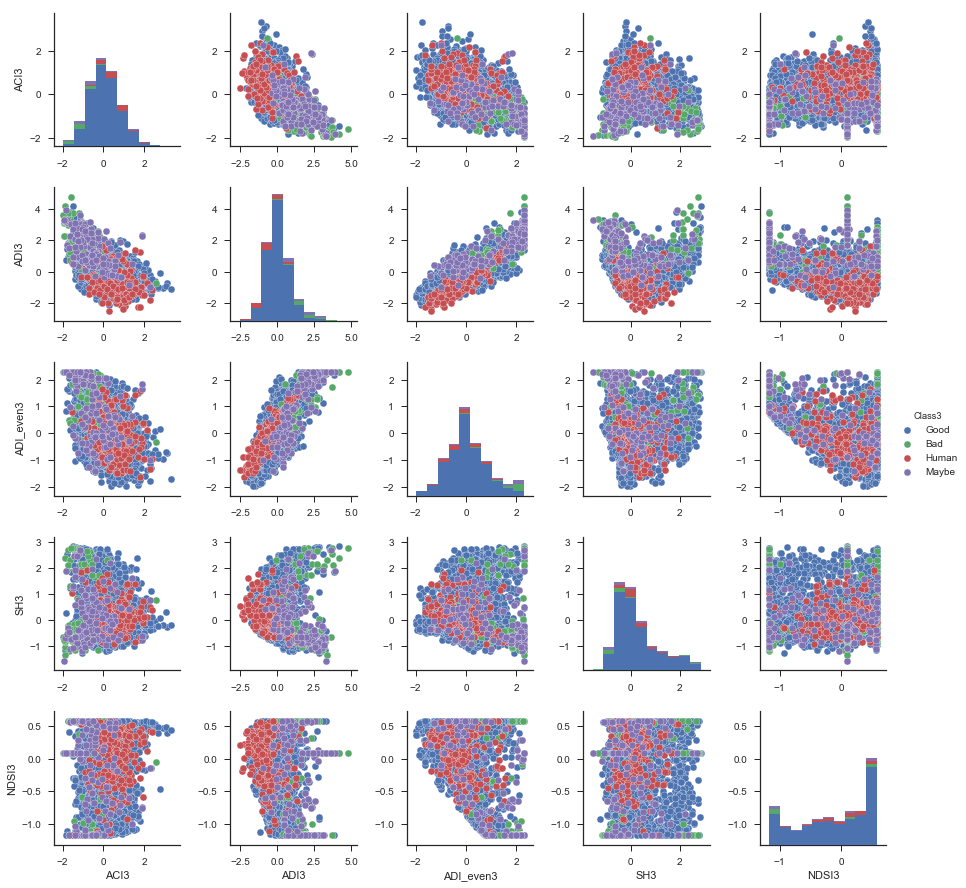

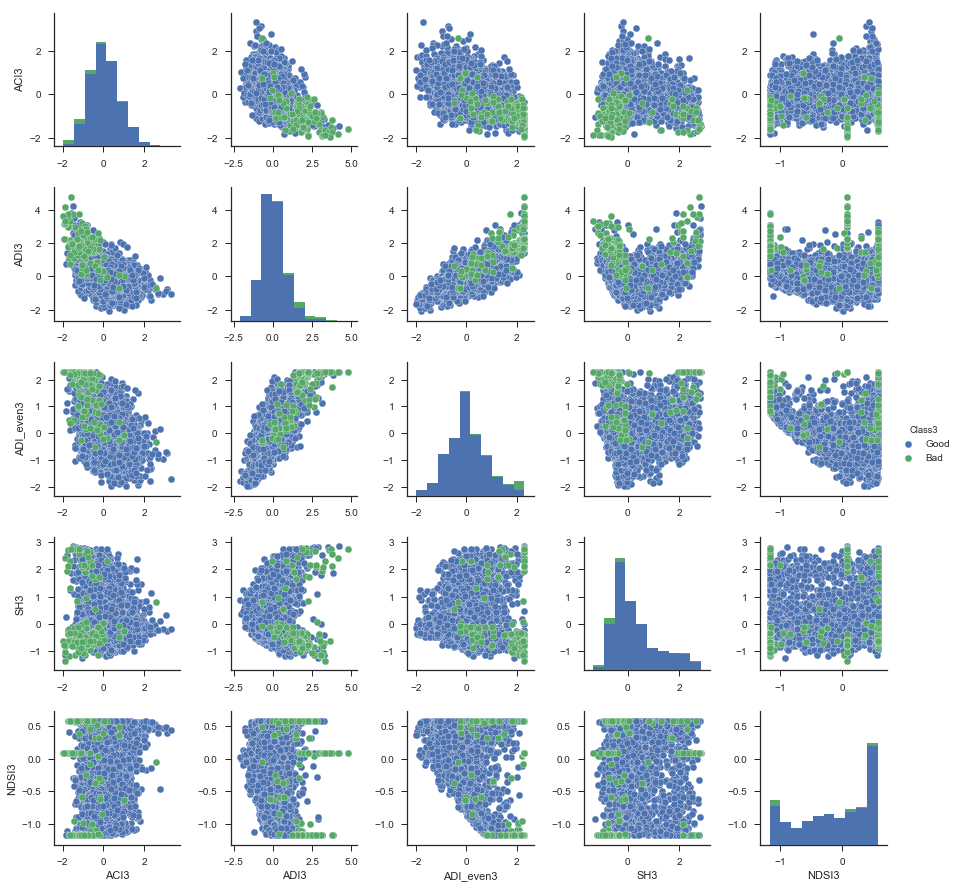

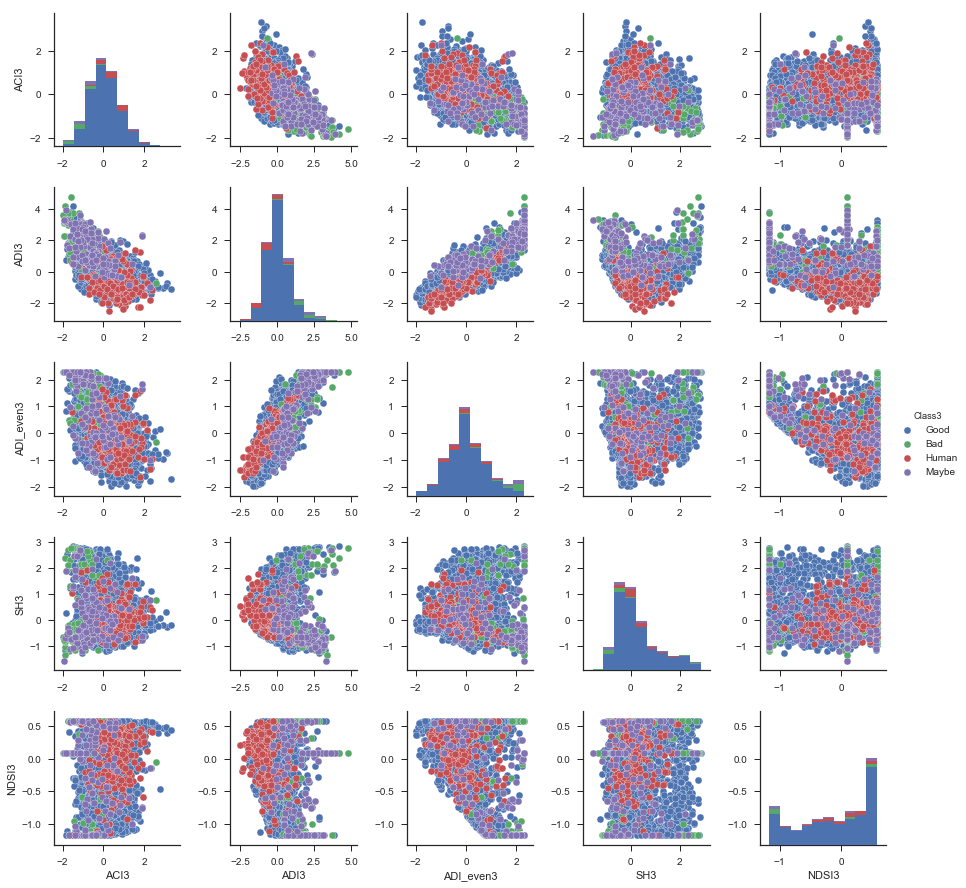

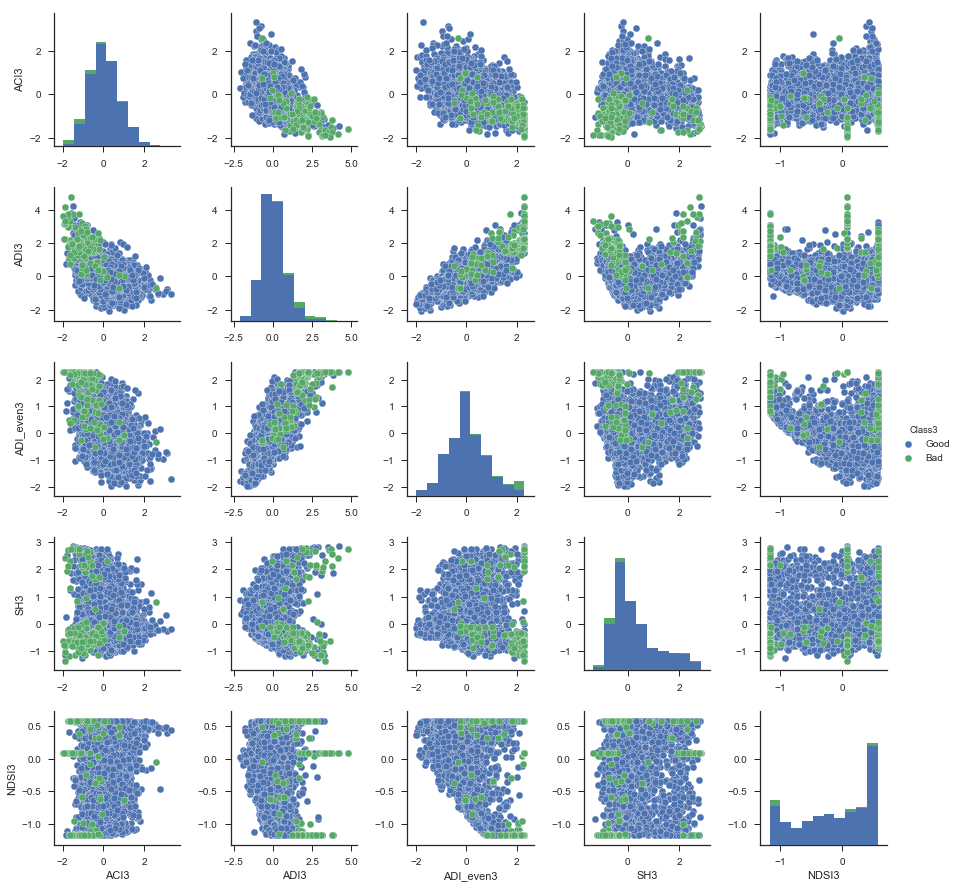

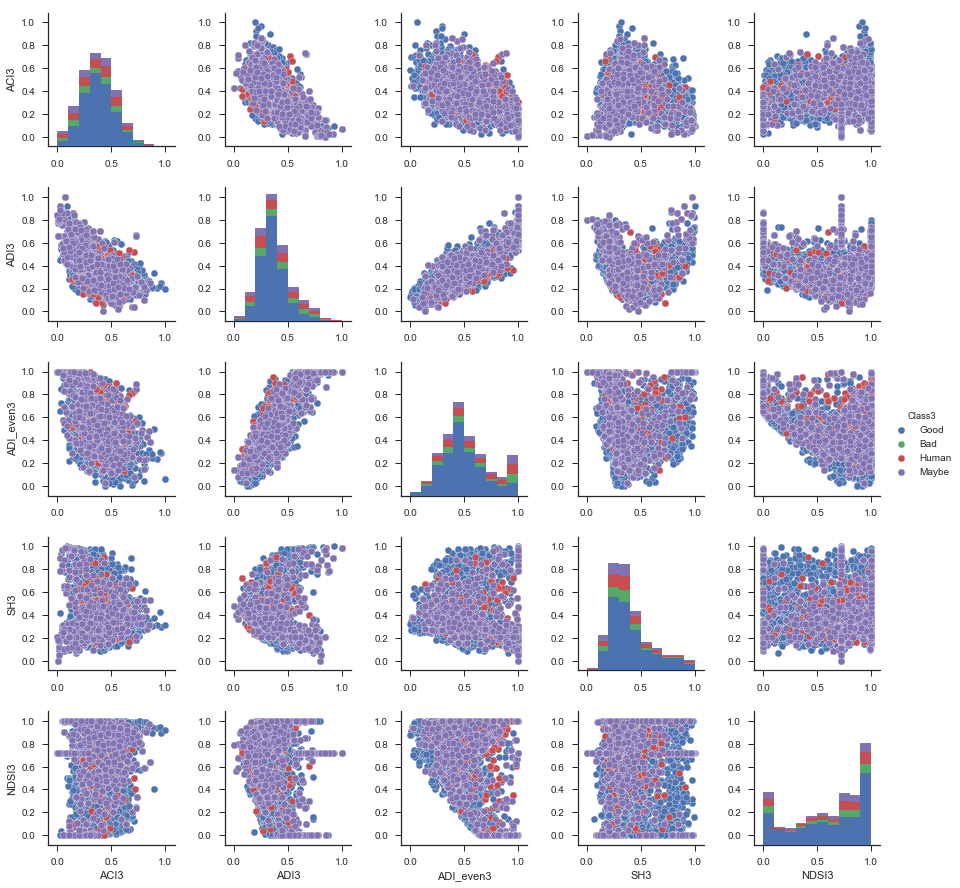

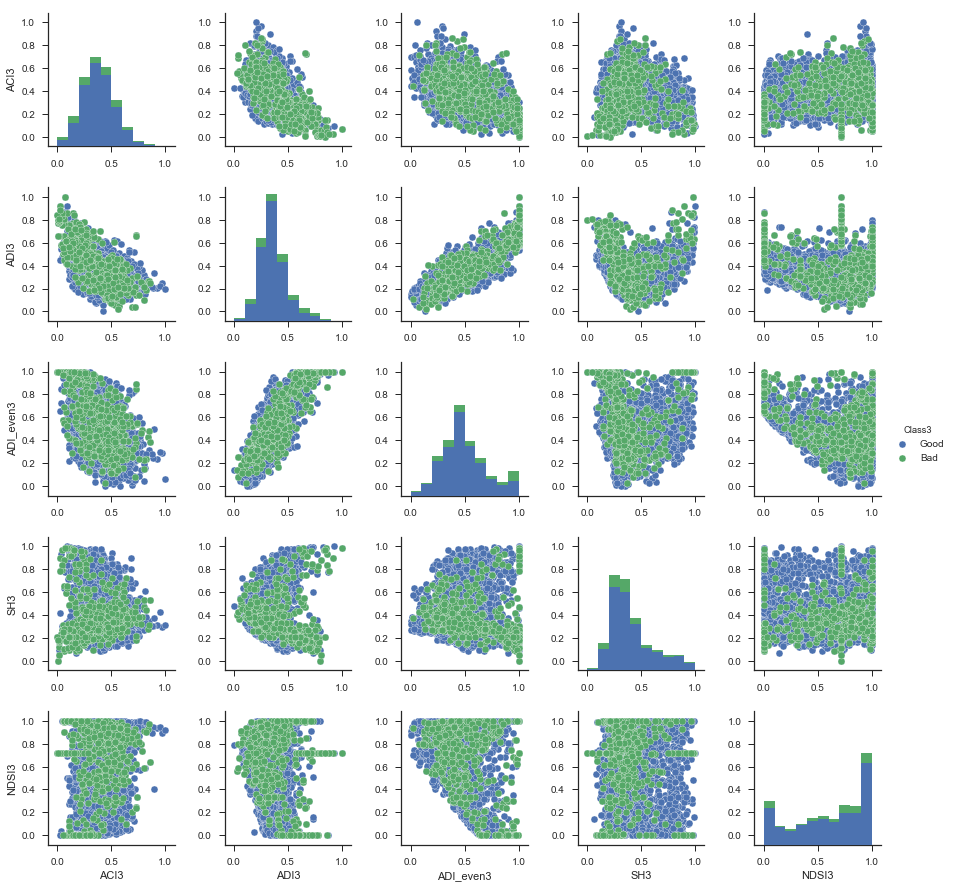

In [25]:
if (norm==1):
    all_df3_sc1, all_df3_sc2, all_df3_sc3, all_df3_sc4, gb_df3_sc1, gb_df3_sc2, gb_df3_sc3, gb_df3_sc4 = get_df_and_plot(norm, 3, ACI_G3, ADI_G3, ADI_even_G3, SH_G3, NDSI_G3, num_specs_g, ACI_B3, ADI_B3, ADI_even_B3, SH_B3, NDSI_B3, num_specs_b, ACI_H3, ADI_H3, ADI_even_H3, SH_H3, NDSI_H3, num_specs_h, ACI_M3, ADI_M3, ADI_even_M3, SH_M3, NDSI_M3, num_specs_m)


Displaying dataframe before scaling:


,ACI4,ADI4,ADI_even4,SH4,NDSI4,Class4
0,9.501211,-2.683312,-0.729801,131.340027,-0.872706,Good
1,7.652887,-3.027320,-0.829100,146.760773,-0.474450,Good
2,14.922321,-3.094808,-1.198582,149.502106,0.839093,Good
3,14.121132,-3.342966,-1.478061,148.837234,0.859028,Good
4,6.593496,-3.007673,-1.111393,126.410240,0.666144,Good


Displaying dataframe with standard scaling:


,ACI4,ADI4,ADI_even4,SH4,NDSI4,Class4
0,-0.341998,0.611712,0.562819,-0.868694,-1.617890,Good
1,-0.687191,-0.326813,0.316426,-0.310848,-1.047452,Good
2,0.670446,-0.510933,-0.600382,-0.211680,0.833988,Good
3,0.520816,-1.187960,-1.293864,-0.235732,0.862542,Good
4,-0.885042,-0.273211,-0.384038,-1.047029,0.586267,Good


Max value of each index:
ACI4         4.83776
ADI4         3.94763
ADI_even4     2.3737
SH4          3.18454
NDSI4        1.06446
Class4         Maybe
dtype: object
Min value of each index:
ACI4         -2.0473
ADI4        -2.69073
ADI_even4   -2.39493
SH4         -2.19226
NDSI4       -1.80022
Class4           Bad
dtype: object
Displaying dataframe with minmax scaling:


,ACI4,ADI4,ADI_even4,SH4,NDSI4,Class4
0,0.247681,0.497478,0.620252,0.246163,0.063647,Good
1,0.197544,0.356099,0.568582,0.349913,0.262775,Good
2,0.394730,0.328363,0.376324,0.368357,0.919546,Good
3,0.372998,0.226376,0.230898,0.363884,0.929514,Good
4,0.168808,0.364174,0.421692,0.212996,0.833072,Good


Max value of each index:
ACI4             1
ADI4             1
ADI_even4        1
SH4              1
NDSI4            1
Class4       Maybe
dtype: object
Min value of each index:
ACI4           0
ADI4           0
ADI_even4      0
SH4            0
NDSI4          0
Class4       Bad
dtype: object
Displaying dataframe with robust scaling:


,ACI4,ADI4,ADI_even4,SH4,NDSI4,Class4
0,-0.194244,0.789735,0.549591,-0.618985,-1.048529,Good
1,-0.474134,-0.158459,0.366330,-0.139712,-0.720236,Good
2,0.626670,-0.344476,-0.315567,-0.054511,0.362550,Good
3,0.505347,-1.028479,-0.831361,-0.075176,0.378983,Good
4,-0.634557,-0.104305,-0.154657,-0.772202,0.219984,Good


Max value of each index:
ACI4         4.00563
ADI4         4.16002
ADI_even4    1.89647
SH4          2.86335
NDSI4        0.49519
Class4         Maybe
dtype: object
Min value of each index:
ACI4        -1.57694
ADI4        -2.54673
ADI_even4   -1.65031
SH4         -1.75613
NDSI4       -1.15346
Class4           Bad
dtype: object
Displaying dataframe with maxabs scaling:


,ACI4,ADI4,ADI_even4,SH4,NDSI4,Class4
0,0.247681,0.497478,0.620252,0.246163,0.063647,Good
0,0.247681,0.497478,0.620252,0.246163,0.063647,Bad
0,0.247681,0.497478,0.620252,0.246163,0.063647,Human
0,0.247681,0.497478,0.620252,0.246163,0.063647,Maybe
0,0.160679,0.456231,0.301722,0.300184,1.000000,Good


Max value of each index:
ACI4             1
ADI4             1
ADI_even4        1
SH4              1
NDSI4            1
Class4       Maybe
dtype: object
Min value of each index:
ACI4           0
ADI4           0
ADI_even4      0
SH4            0
NDSI4          0
Class4       Bad
dtype: object


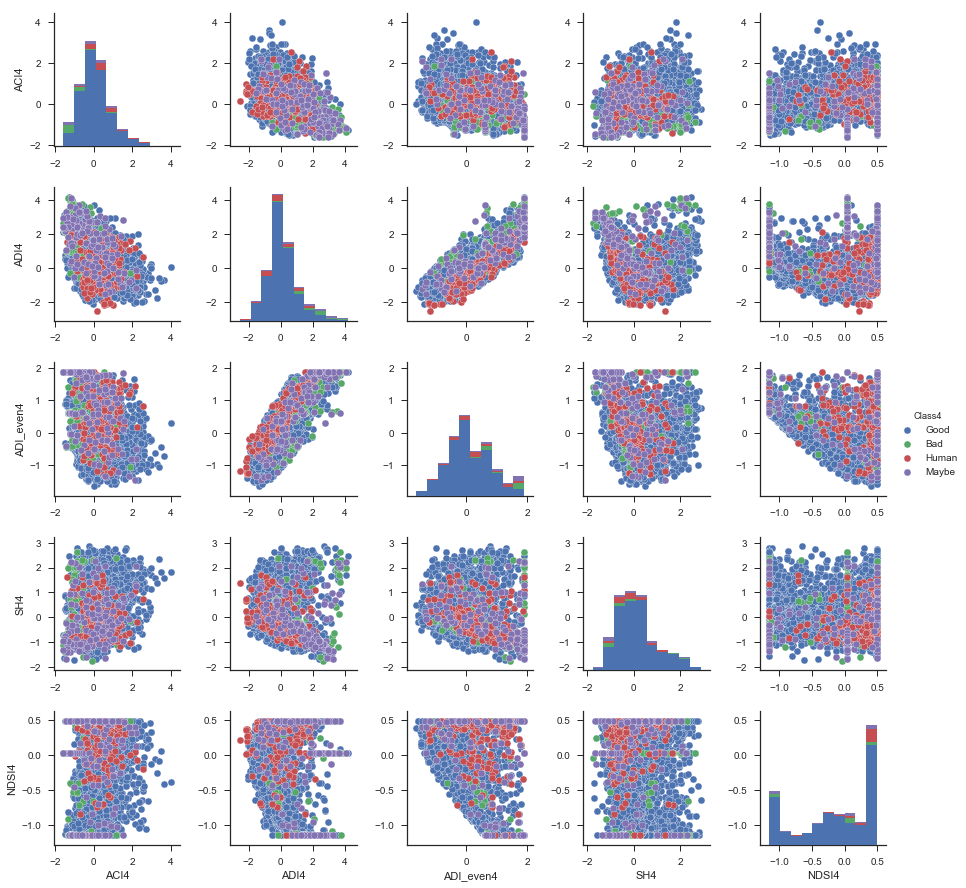

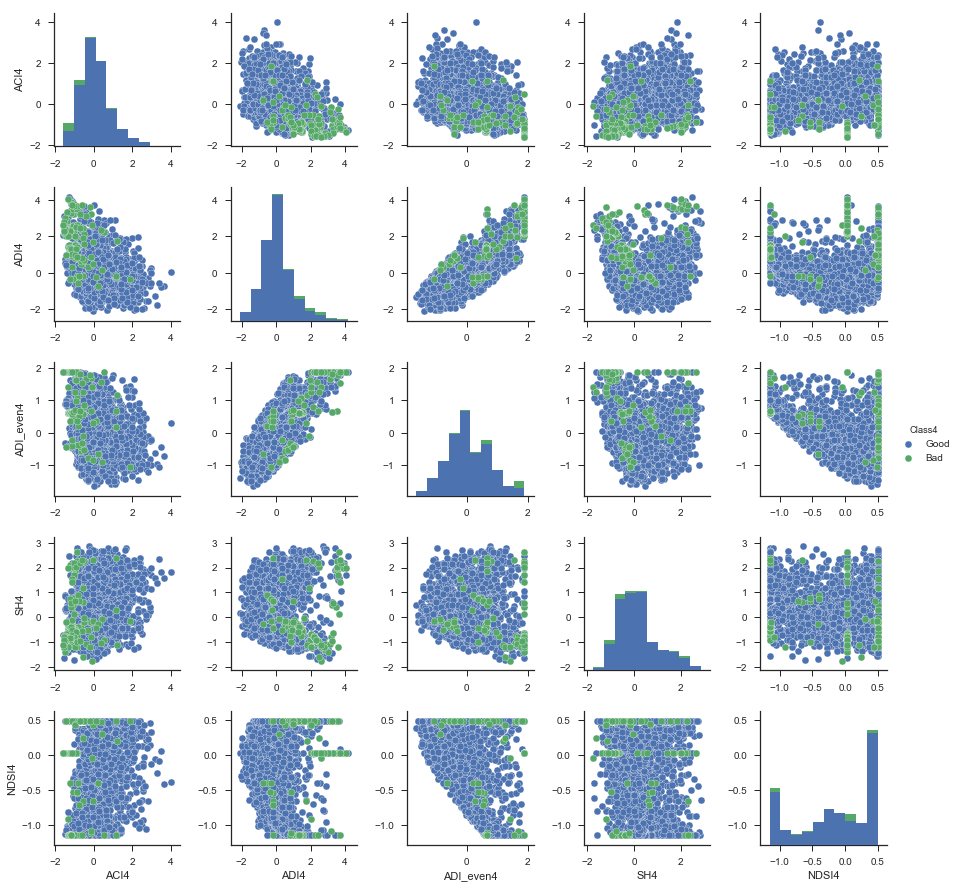

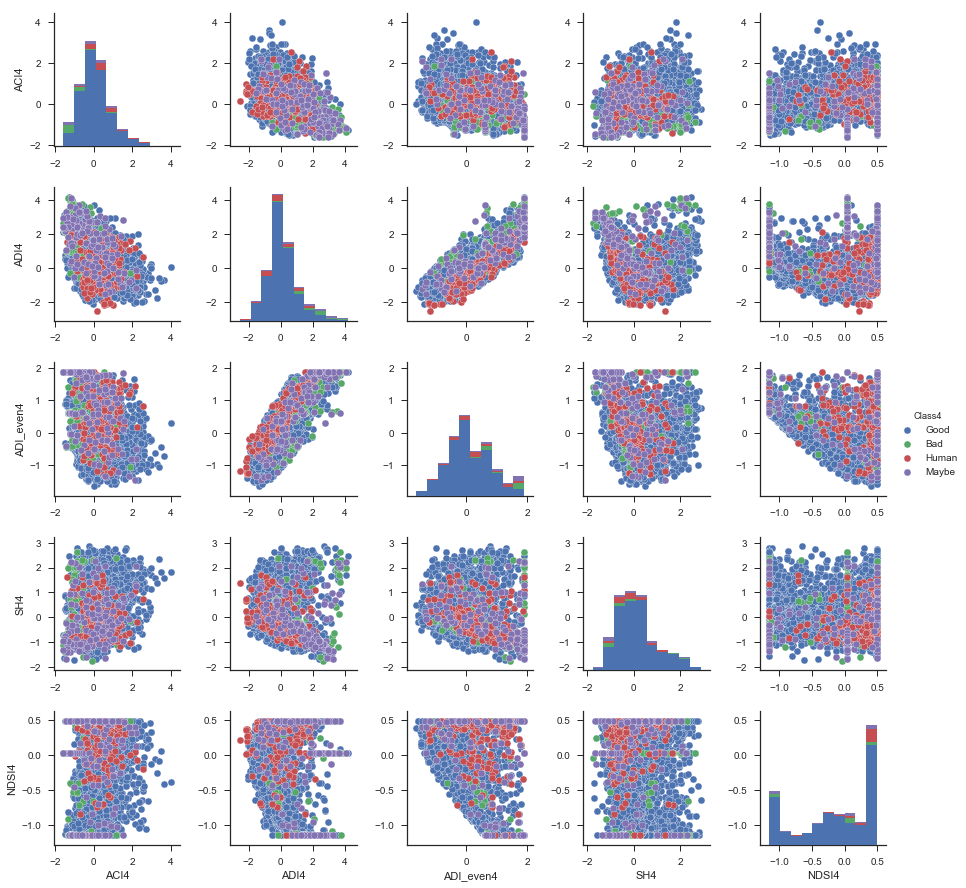

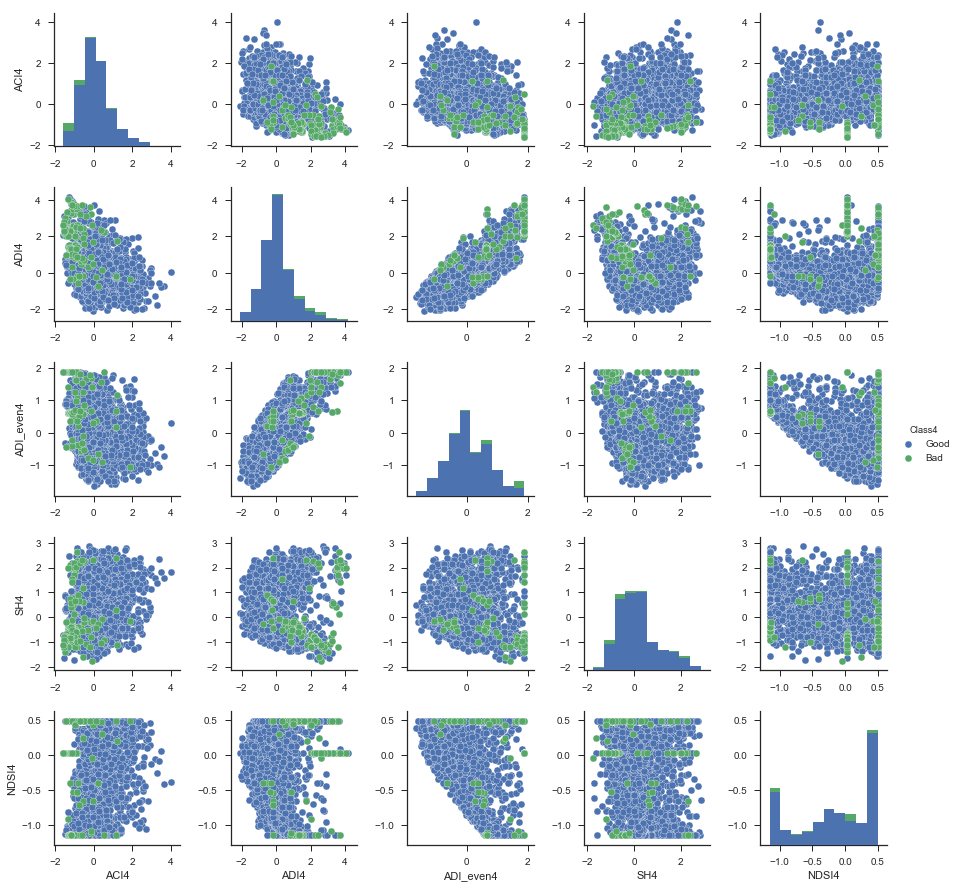

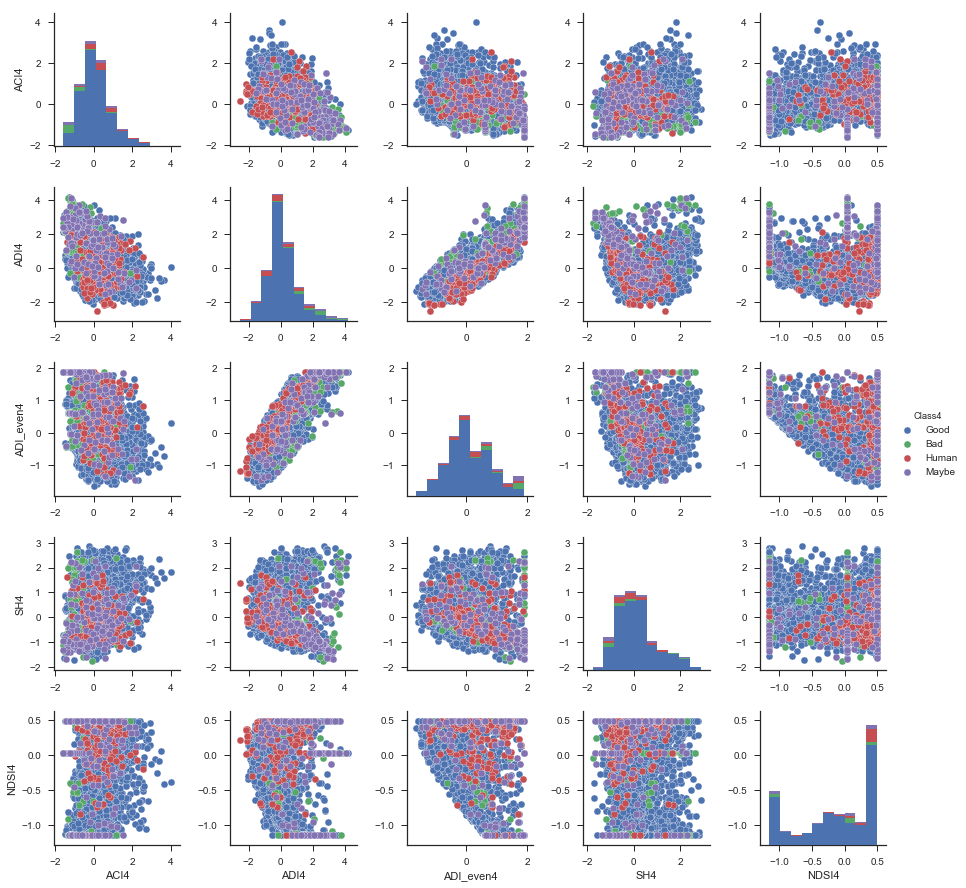

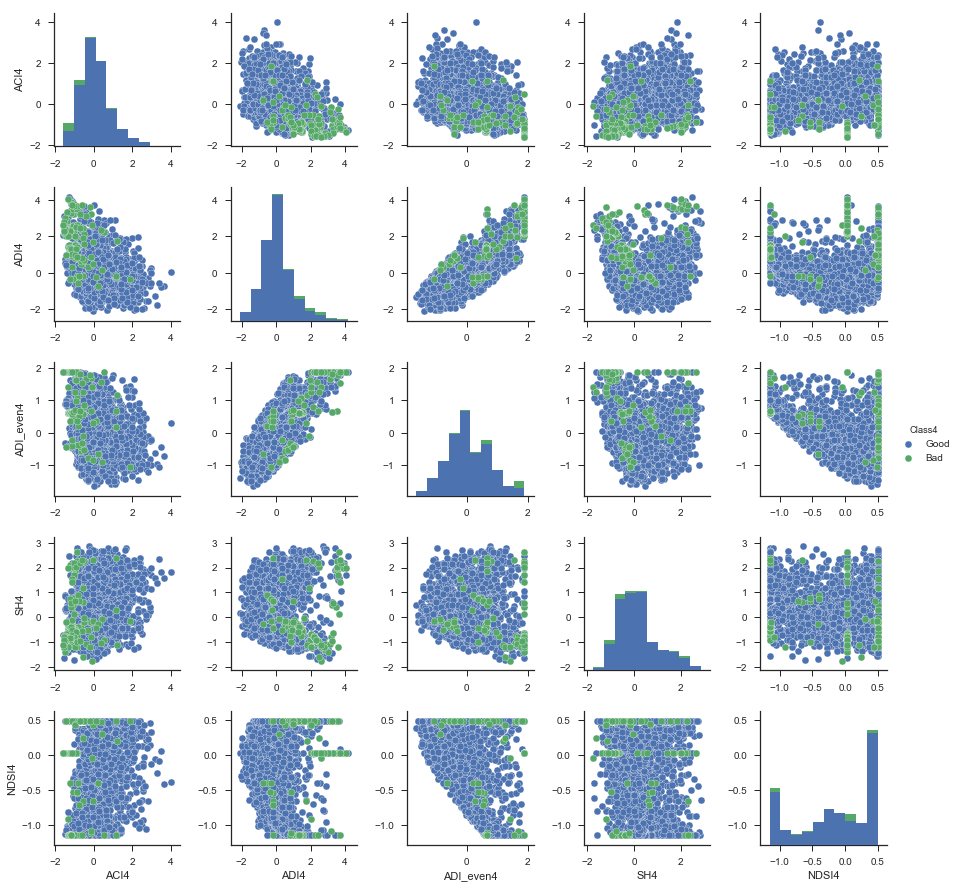

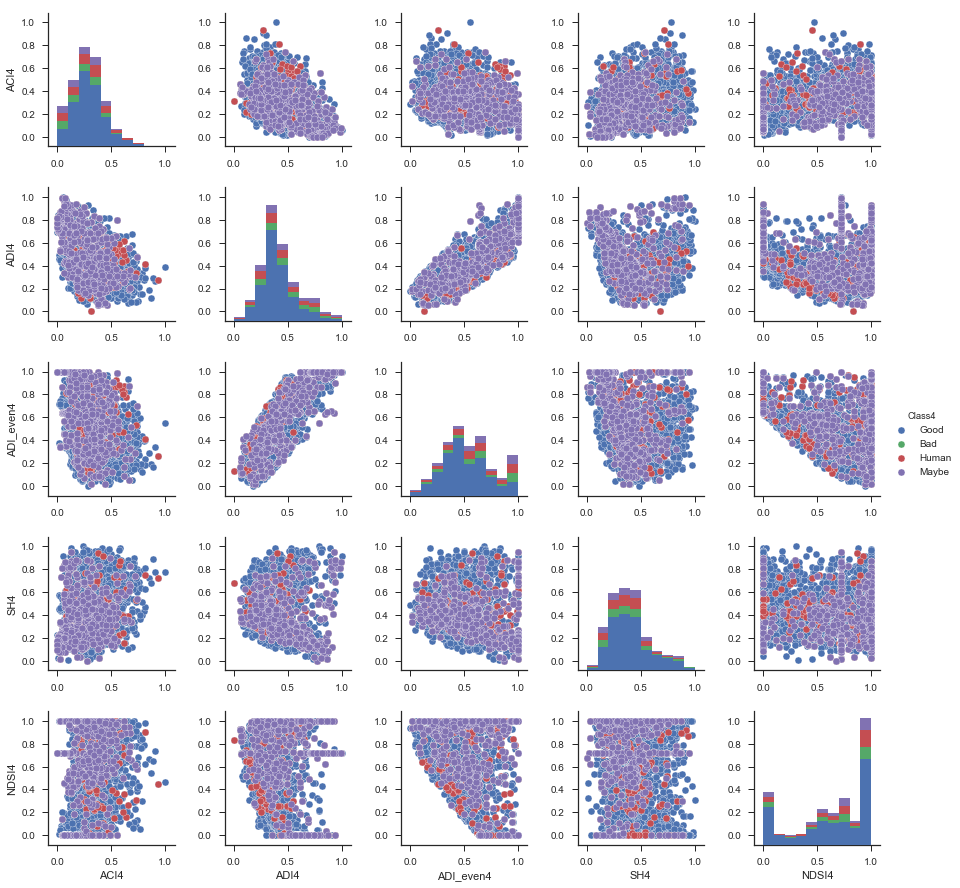

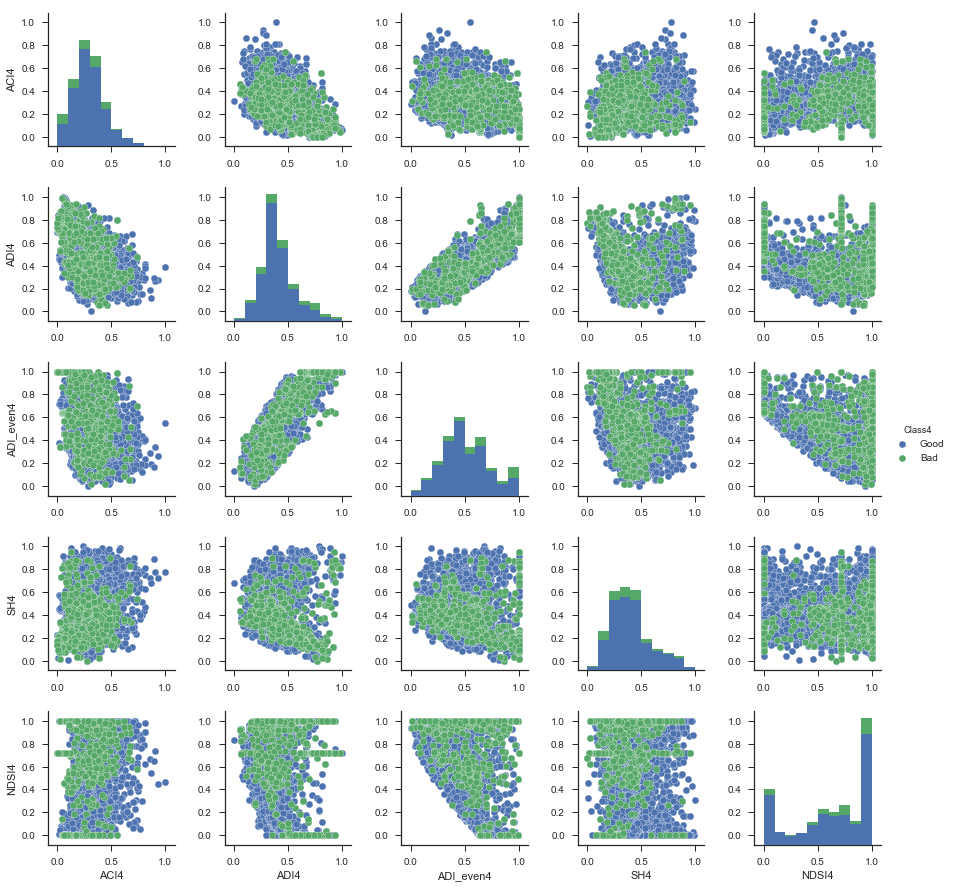

In [26]:
if (norm==1):
    all_df4_sc1, all_df4_sc2, all_df4_sc3, all_df4_sc4, gb_df4_sc1, gb_df4_sc2, gb_df4_sc3, gb_df4_sc4 = get_df_and_plot(norm, 4, ACI_G4, ADI_G4, ADI_even_G4, SH_G4, NDSI_G4, num_specs_g, ACI_B4, ADI_B4, ADI_even_B4, SH_B4, NDSI_B4, num_specs_b, ACI_H4, ADI_H4, ADI_even_H4, SH_H4, NDSI_H4, num_specs_h, ACI_M4, ADI_M4, ADI_even_M4, SH_M4, NDSI_M4, num_specs_m)


In [28]:
#Saving all scaled data - throws error to save as df

#all_dfX_scY
#X = channel number - refers to original spectrogram if it's just df
#Y = which scaler (1 = Standard, 2 = MinMax, 3 = Robust, 4 = )

#data_scaled_std = (all_df_sc1, all_df1_sc1, all_df2_sc1, all_df3_sc1, all_df4_sc1)
#data_scaled_minmax = (all_df_sc2, all_df1_sc2, all_df2_sc2, all_df3_sc2, all_df4_sc2)
#data_scaled_robust = (all_df_sc3, all_df1_sc3, all_df2_sc3, all_df3_sc3, all_df4_sc3)
#data_scaled_maxabs = (all_df_sc4, all_df1_sc4, all_df2_sc4, all_df3_sc4, all_df4_sc4)

#np.savez('Data_Scaled.npz', std=data_scaled_std, minmax=data_scaled_minmax, robust=data_scaled_robust, maxabs=data_scaled_maxabs)

#TO LOAD:
#data_scaled = np.load('Data_Scaled.npz', mmap_mode='r')
#data_scaled_std = data_scaled['std']
#data_scaled_minmax = data_scaled['minmax']
#data_scaled_robust = data_scaled['robust']
#data_scaled_maxabs = data_scaled['maxabs']



In [33]:
all_df_sc1.to_csv('scaled_orig_std.csv', index=False)
all_df_sc2.to_csv('scaled_orig_minmax.csv', index=False)
all_df_sc3.to_csv('scaled_orig_robust.csv', index=False)
all_df_sc4.to_csv('scaled_orig_maxabs.csv', index=False)

all_df1_sc1.to_csv('scaled_ch1_std.csv', index=False)
all_df1_sc2.to_csv('scaled_ch1_minmax.csv', index=False)
all_df1_sc3.to_csv('scaled_ch1_robust.csv', index=False)
all_df1_sc4.to_csv('scaled_ch1_maxabs.csv', index=False)

all_df2_sc1.to_csv('scaled_ch2_std.csv', index=False)
all_df2_sc2.to_csv('scaled_ch2_minmax.csv', index=False)
all_df2_sc3.to_csv('scaled_ch2_robust.csv', index=False)
all_df2_sc4.to_csv('scaled_ch2_maxabs.csv', index=False)

all_df3_sc1.to_csv('scaled_ch3_std.csv', index=False)
all_df3_sc2.to_csv('scaled_ch3_minmax.csv', index=False)
all_df3_sc3.to_csv('scaled_ch3_robust.csv', index=False)
all_df3_sc4.to_csv('scaled_ch3_maxabs.csv', index=False)

all_df4_sc1.to_csv('scaled_ch4_std.csv', index=False)
all_df4_sc2.to_csv('scaled_ch4_minmax.csv', index=False)
all_df4_sc3.to_csv('scaled_ch4_robust.csv', index=False)
all_df4_sc4.to_csv('scaled_ch4_maxabs.csv', index=False)



In [34]:
#check
orig_scaled_std = pd.read_csv('scaled_orig_std.csv')
orig_scaled_std.head()


,ACI,ADI,ADI_even,SH,NDSI,Class
0,0.671103,0.031454,-0.317587,-0.041062,0.466935,Good
1,0.115697,0.355366,-0.473165,-0.278941,0.681044,Good
2,-0.548454,0.444219,0.121571,-0.466286,-0.253839,Good
3,-0.711225,0.361212,0.119990,-0.497827,-0.364132,Good
4,0.314021,0.303039,-0.410604,-0.246790,0.297530,Good
